In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
import operator
from collections import defaultdict, Counter
import warnings
import datetime
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from statsmodels.tsa.ar_model import AR
warnings.filterwarnings('ignore')
%matplotlib inline

<h1>1. Get the data</h1>

In [3]:
data = pd.read_csv('train_2011_2012_2013.csv', sep=';')

In [4]:
# We keep only usefull columns
data = data[['DATE', 'ASS_ASSIGNMENT', 'CSPL_RECEIVED_CALLS']]

In [5]:
data.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS
0,2011-04-24 01:30:00.000,Téléphonie,0
1,2011-04-24 01:30:00.000,Téléphonie,0
2,2011-04-24 01:30:00.000,Téléphonie,0
3,2011-04-24 01:30:00.000,Téléphonie,0
4,2011-04-24 01:30:00.000,Téléphonie,1


In [6]:
# We group by DATE and ASS_ASSIGNMENT and sum over CSPL_RECEIVED_CALLS
groupbydata = data.groupby(['DATE', 'ASS_ASSIGNMENT'])['CSPL_RECEIVED_CALLS'].sum()
newarr = []
for key, value in groupbydata.items():
    newarr.append(list(key) + [value])
data = pd.DataFrame(newarr)
data.columns = ['DATE', 'ASS_ASSIGNMENT', 'CSPL_RECEIVED_CALLS']
data = data[~data.ASS_ASSIGNMENT.isin(['Evenements', 'Gestion Amex'])]

In [7]:
data.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS
0,2011-01-01 00:00:00.000,Crises,0
1,2011-01-01 00:00:00.000,Domicile,0
2,2011-01-01 00:00:00.000,Gestion,0
3,2011-01-01 00:00:00.000,Gestion - Accueil Telephonique,0
5,2011-01-01 00:00:00.000,Gestion Assurances,0


In [8]:
data.shape

(1016660, 3)

<h1>2. Create new features</h1>

In [9]:
# Date without '-', ':' and final 0
def simplifyDATE(x):
    return re.sub(r'[^\w]', '', x)[:12]

def getWeekDayRow(x):
    return str(datetime.datetime(int(x[:4]), int(x[4:6]), int(x[6:8]), int(x[8:10]), int(x[10:12])).weekday())

def getWeekDay(data):
    data['WEEKDAY'] = data['DATE_SIMPLIFY'].map(getWeekDayRow)
    
def splitDate(data):
    data['YEAR'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[:4]))
    data['MONTH'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[4:6]))
    data['DAY'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[6:8]))
    data['HOUR'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[8:10]))
    data['MIN'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[10:12]))

def isWeekEnd(x):
    return 1 if datetime.datetime(int(x[:4]), int(x[4:6]), int(x[6:8]), int(x[8:10]), int(x[10:12])).weekday() in [5, 6] else 0

def getWeekEnd(data):
    data['WEEKEND'] = data['DATE_SIMPLIFY'].map(isWeekEnd)
    
def getYearMonthDay(data):
    data['YEAR_MONTH_DAY'] = data['DATE_SIMPLIFY'].map(lambda x: int(x[:8]))

def getDayAndNight(data):
    data['NIGHT'] = data['DATE_SIMPLIFY'].map(lambda x: 1 if 8 <= int(x[8:10]) and int(x[8:10]) <= 20 else 0)
    
def dummifyWeekday(data):
    dummies = pd.get_dummies(data['WEEKDAY'])
    dummies.columns = ['WEEKDAY' + str(c) for c in dummies.columns]
    data[dummies.columns] = dummies

In [10]:
data['DATE_SIMPLIFY'] = data['DATE'].map(simplifyDATE)
data['HOURMIN'] = data['DATE_SIMPLIFY'].map(lambda x: x[8:])
getWeekDay(data)
splitDate(data)
getWeekEnd(data)
getYearMonthDay(data)
getDayAndNight(data)
dummifyWeekday(data)

In [11]:
data.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS,DATE_SIMPLIFY,HOURMIN,WEEKDAY,YEAR,MONTH,DAY,HOUR,...,WEEKEND,YEAR_MONTH_DAY,NIGHT,WEEKDAY0,WEEKDAY1,WEEKDAY2,WEEKDAY3,WEEKDAY4,WEEKDAY5,WEEKDAY6
0,2011-01-01 00:00:00.000,Crises,0,201101010000,0000,5,2011,1,1,0,...,1,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2011-01-01 00:00:00.000,Domicile,0,201101010000,0000,5,2011,1,1,0,...,1,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2011-01-01 00:00:00.000,Gestion,0,201101010000,0000,5,2011,1,1,0,...,1,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,2011-01-01 00:00:00.000,Gestion - Accueil Telephonique,0,201101010000,0000,5,2011,1,1,0,...,1,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5,2011-01-01 00:00:00.000,Gestion Assurances,0,201101010000,0000,5,2011,1,1,0,...,1,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [12]:
data.columns

Index(['DATE', 'ASS_ASSIGNMENT', 'CSPL_RECEIVED_CALLS', 'DATE_SIMPLIFY',
       'HOURMIN', 'WEEKDAY', 'YEAR', 'MONTH', 'DAY', 'HOUR', 'MIN', 'WEEKEND',
       'YEAR_MONTH_DAY', 'NIGHT', 'WEEKDAY0', 'WEEKDAY1', 'WEEKDAY2',
       'WEEKDAY3', 'WEEKDAY4', 'WEEKDAY5', 'WEEKDAY6'],
      dtype='object')

<h1>3. Some analysis</h1>

### 3.1 General Analysis

In [13]:
# Nombre de calls
print("Total number of calls: %d" %sum(data.CSPL_RECEIVED_CALLS))

Total number of calls: 10266867


In [14]:
print("The oldest date is %s and the newest is %s" %(min(data.DATE), max(data.DATE)))

The oldest date is 2011-01-01 00:00:00.000 and the newest is 2013-12-31 23:30:00.000


In [15]:
class_label = np.unique(data.ASS_ASSIGNMENT)
print("There are %d ASS_ASSIGNMENT: %s" %(len(class_label), class_label))

There are 26 ASS_ASSIGNMENT: ['CAT' 'CMS' 'Crises' 'Domicile' 'Gestion' 'Gestion - Accueil Telephonique'
 'Gestion Assurances' 'Gestion Clients' 'Gestion DZ'
 'Gestion Relation Clienteles' 'Gestion Renault' 'Japon' 'Manager'
 'Mécanicien' 'Médical' 'Nuit' 'Prestataires' 'RENAULT' 'RTC'
 'Regulation Medicale' 'SAP' 'Services' 'Tech. Axa' 'Tech. Inter'
 'Tech. Total' 'Téléphonie']


In [16]:
data_by_class = {}
for class_lab in class_label:
    data_by_class[class_lab] = data.loc[data.ASS_ASSIGNMENT==class_lab,:]

In [17]:
dates_by_class = {}
print("%-*s |%s" %(30, "Service", "Nombre de dates uniques"))
print("-"*54)
for item in data_by_class.items():
    unique_dates_ = np.unique(item[1].YEAR_MONTH_DAY)
    unique_dates_ = set([str(x) for x in unique_dates_])
    dates_by_class[item[0]] = len(unique_dates_)
    print("%-*s |%d" %(30, item[0], len(unique_dates_)))

Service                        |Nombre de dates uniques
------------------------------------------------------
Gestion Assurances             |924
Gestion - Accueil Telephonique |995
Mécanicien                     |979
Gestion Renault                |986
CMS                            |721
Domicile                       |1012
SAP                            |1006
Tech. Axa                      |1012
Tech. Inter                    |1012
Manager                        |1012
Gestion Clients                |861
Téléphonie                     |1012
CAT                            |788
Japon                          |1012
Médical                        |1012
Services                       |1012
Gestion                        |1008
Gestion Relation Clienteles    |823
Tech. Total                    |1012
RENAULT                        |1012
Gestion DZ                     |842
Prestataires                   |664
Crises                         |763
RTC                            |750
Regulation Me

In [18]:
grouby_by_class = {}
for class_lab in class_label:
    grouby_by_class[class_lab] = data_by_class[class_lab].groupby(['HOURMIN'])['CSPL_RECEIVED_CALLS'].sum()/dates_by_class[class_lab]

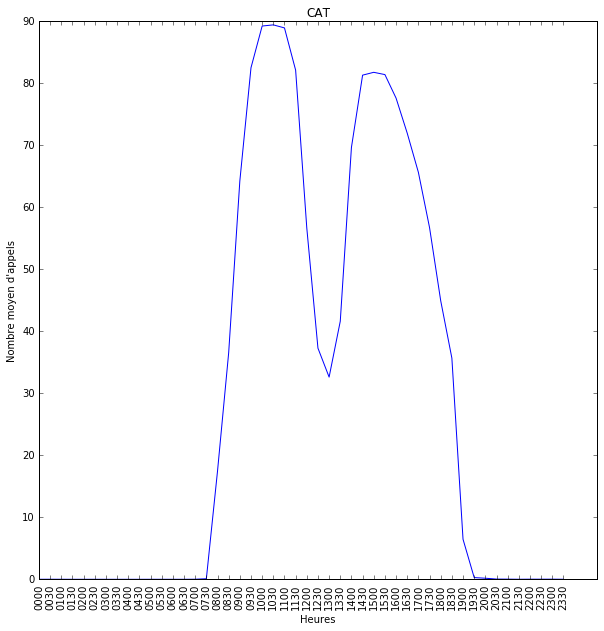

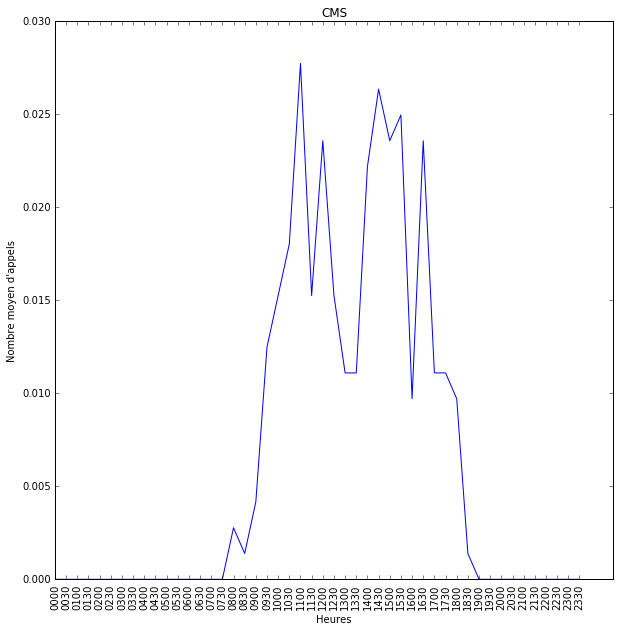

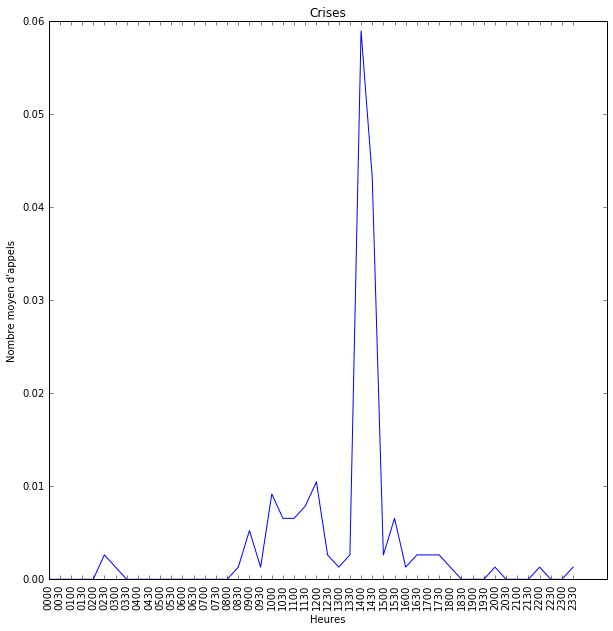

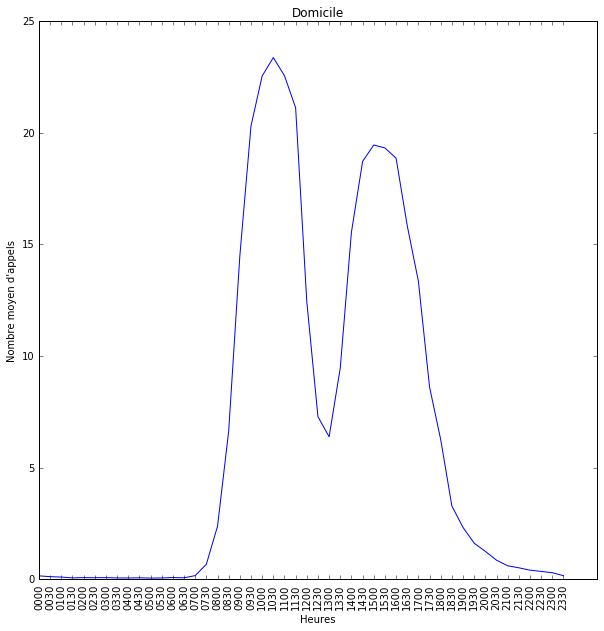

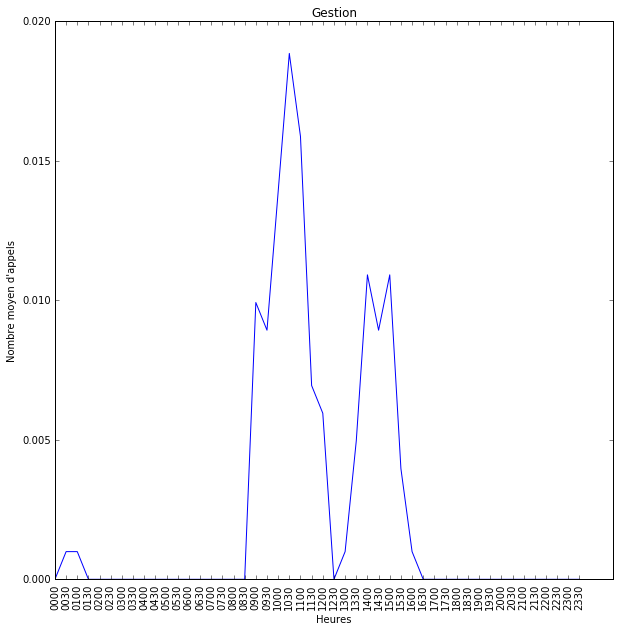

...

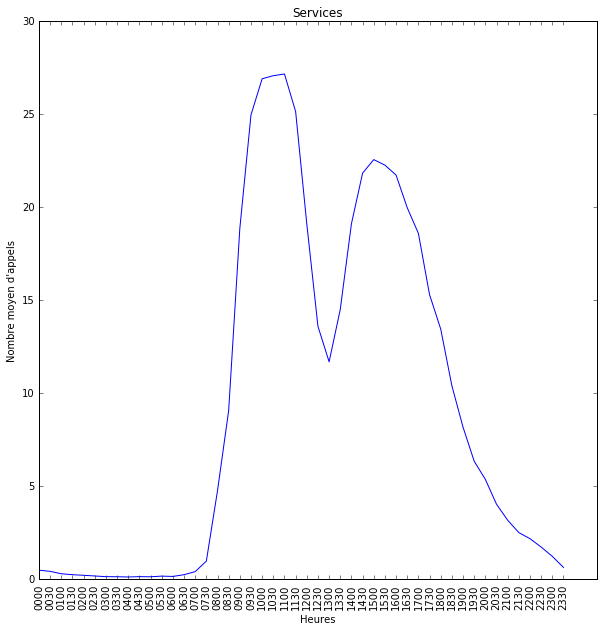

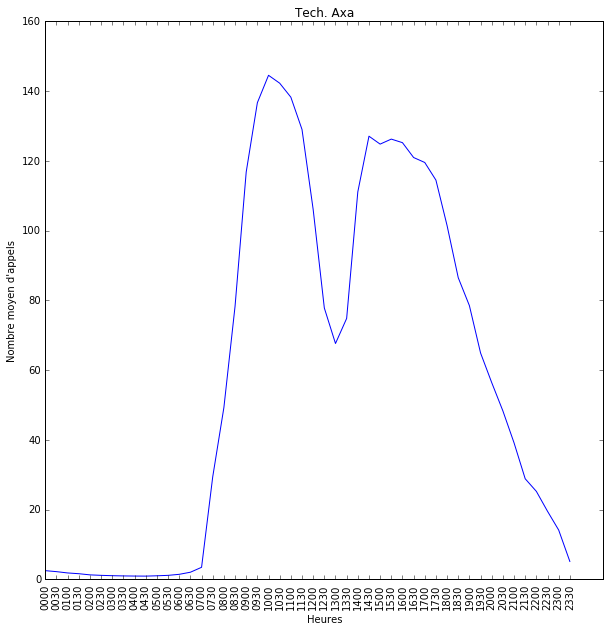

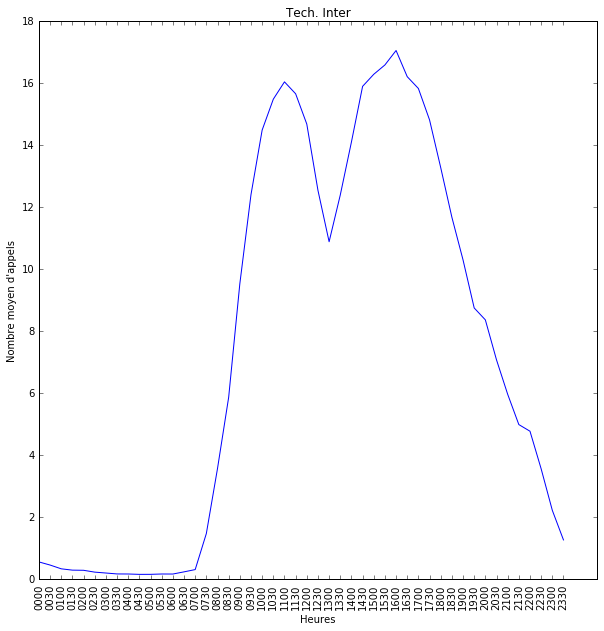

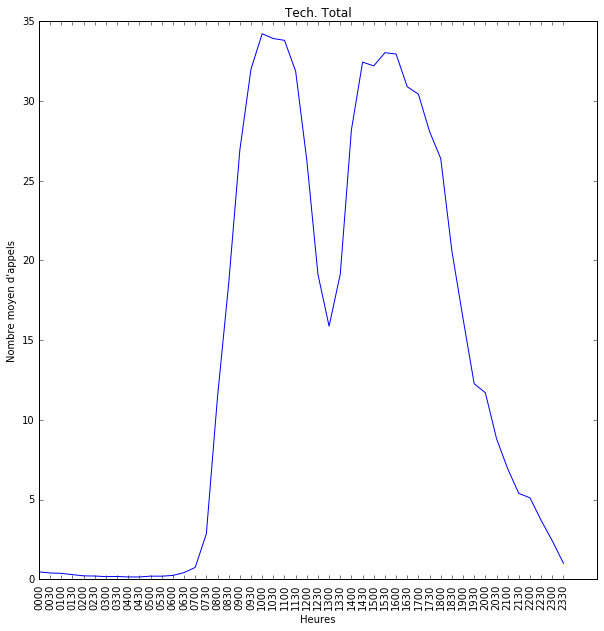

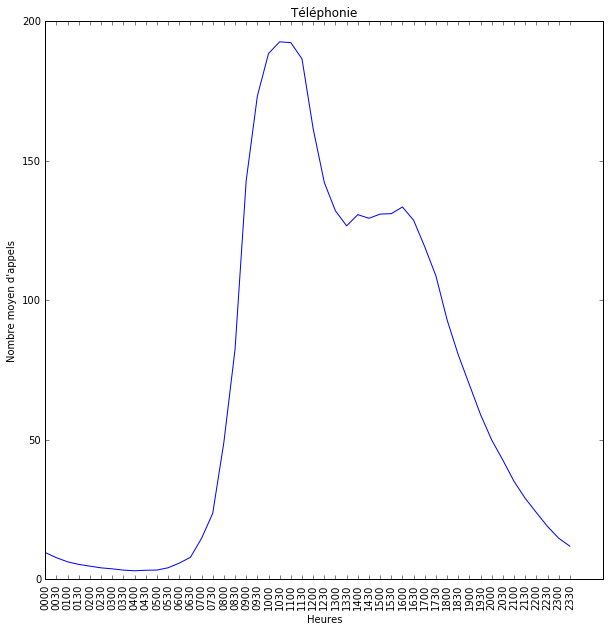

In [19]:
for class_lab in class_label:
    plt.figure(figsize=(10,10))
    plt.plot(range(48), grouby_by_class[class_lab].values)
    plt.xticks(range(48), grouby_by_class[class_lab].keys(), rotation=90)
    plt.xlabel('Heures')
    plt.ylabel("Nombre moyen d'appels")
    plt.title(class_lab)

In [20]:
print("%-*s |%-*s |%s" %(30, "Service", 15, "# de données", "% du total"))
print("-"*60)
for item in data_by_class.items():
    print("%-*s |%-*s |%.2f" %(30, item[0], 15, item[1].shape[0], 100*item[1].shape[0]/data.shape[0]))

Service                        |# de données    |% du total
------------------------------------------------------------
Gestion Assurances             |40879           |4.02
Gestion - Accueil Telephonique |47225           |4.65
Mécanicien                     |27131           |2.67
Gestion Renault                |46285           |4.55
CMS                            |18803           |1.85
Domicile                       |48478           |4.77
SAP                            |47661           |4.69
Tech. Axa                      |47516           |4.67
Tech. Inter                    |48476           |4.77
Manager                        |40441           |3.98
Gestion Clients                |33614           |3.31
Téléphonie                     |48497           |4.77
CAT                            |21503           |2.12
Japon                          |48433           |4.76
Médical                        |48478           |4.77
Services                       |48476           |4.77
Gestion        

In [21]:
grouby_by_class_weekday = {}
for class_lab in class_label:
    grouby_by_class_weekday[class_lab] = data_by_class[class_lab].groupby(['WEEKDAY'])['CSPL_RECEIVED_CALLS'].sum()

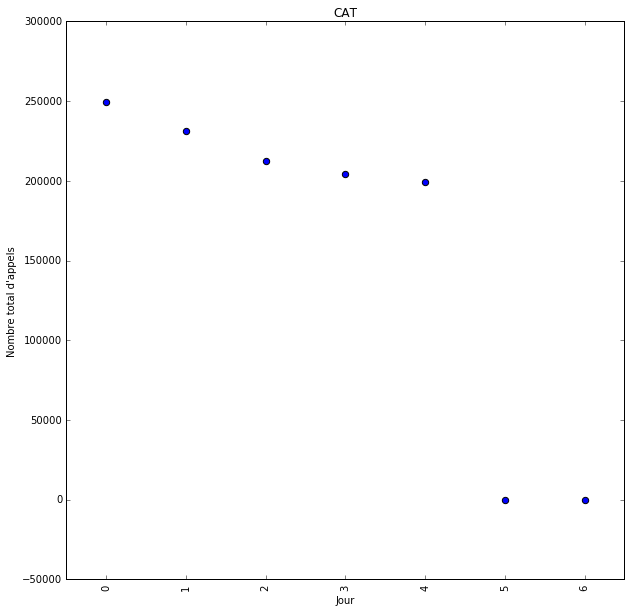

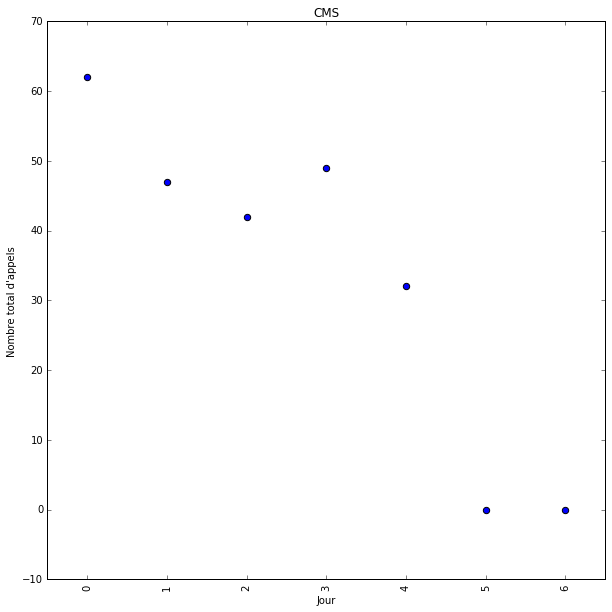

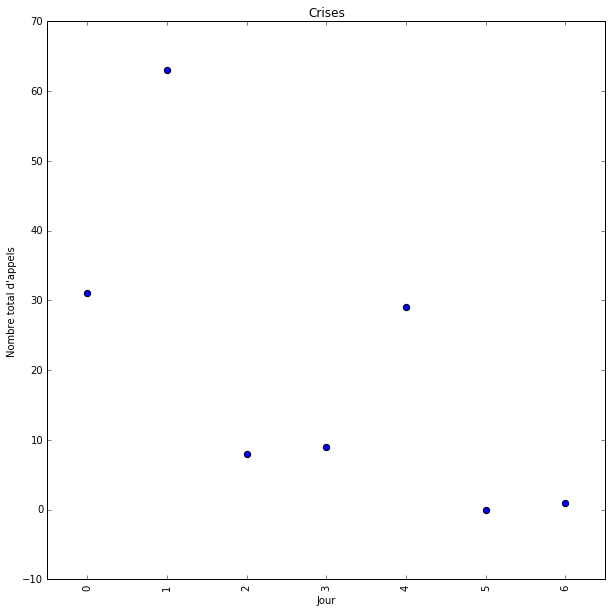

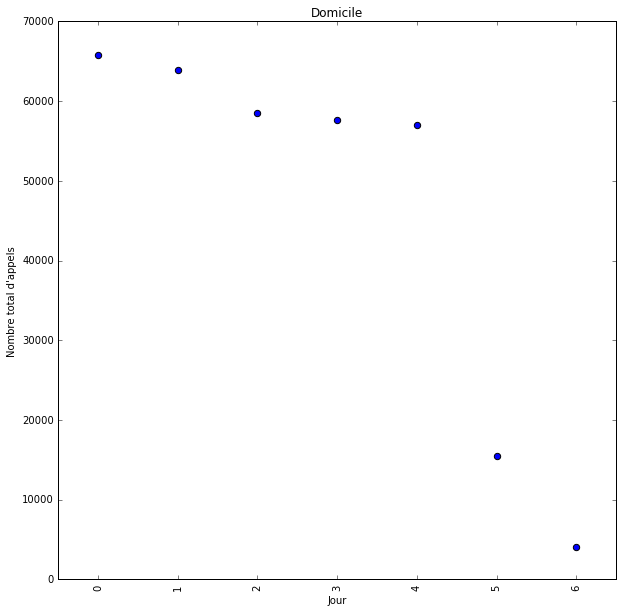

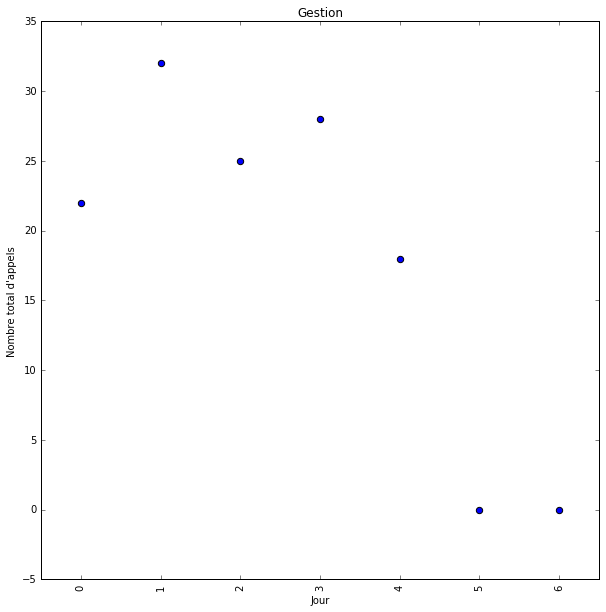

...

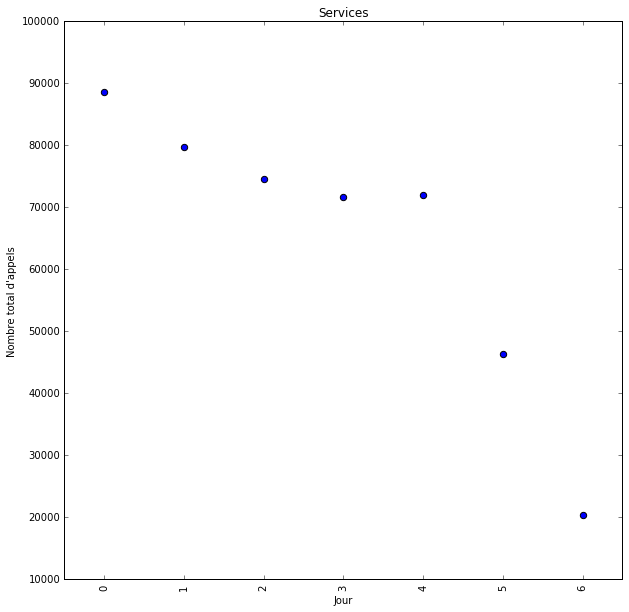

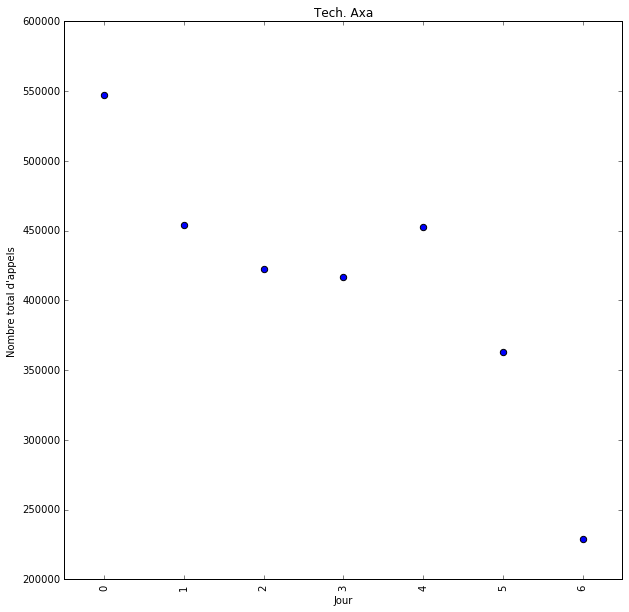

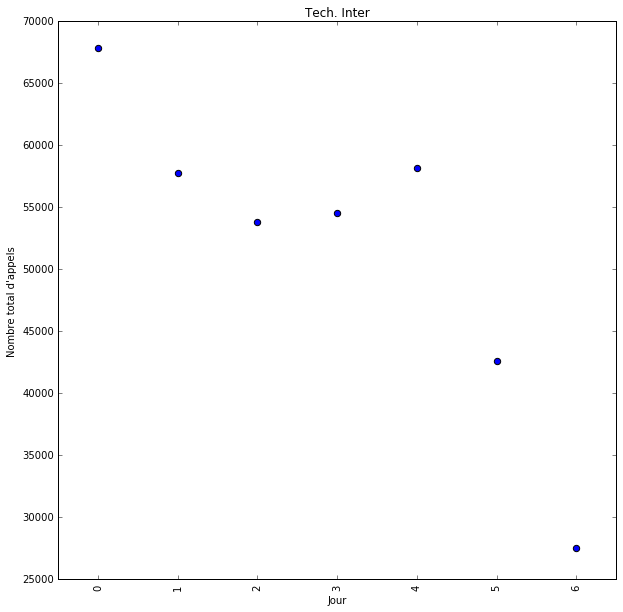

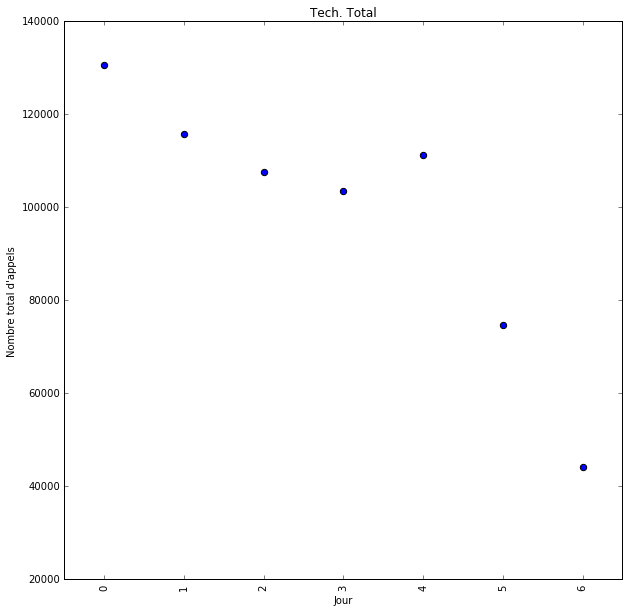

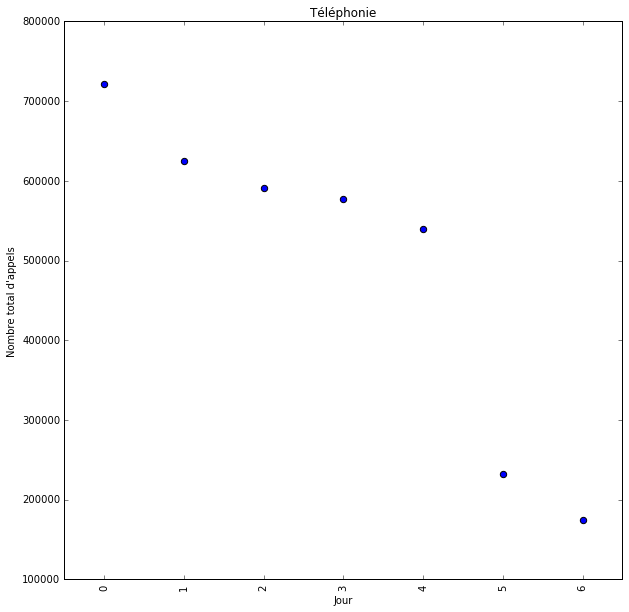

In [22]:
for class_lab in class_label:
    plt.figure(figsize=(10,10))
    plt.scatter(range(7), grouby_by_class_weekday[class_lab].values, marker='o', s=40)
    plt.xticks(range(7), grouby_by_class_weekday[class_lab].keys(), rotation=90)
    plt.xlim((-.5,6.5))
    plt.xlabel('Jour')
    plt.ylabel("Nombre total d'appels")
    plt.title(class_lab)

In [23]:
grouby_by_class_yearmonthday = {}
for class_lab in class_label:
    grouby_by_class_yearmonthday[class_lab] = data_by_class[class_lab].groupby(['YEAR_MONTH_DAY'])['CSPL_RECEIVED_CALLS'].sum()

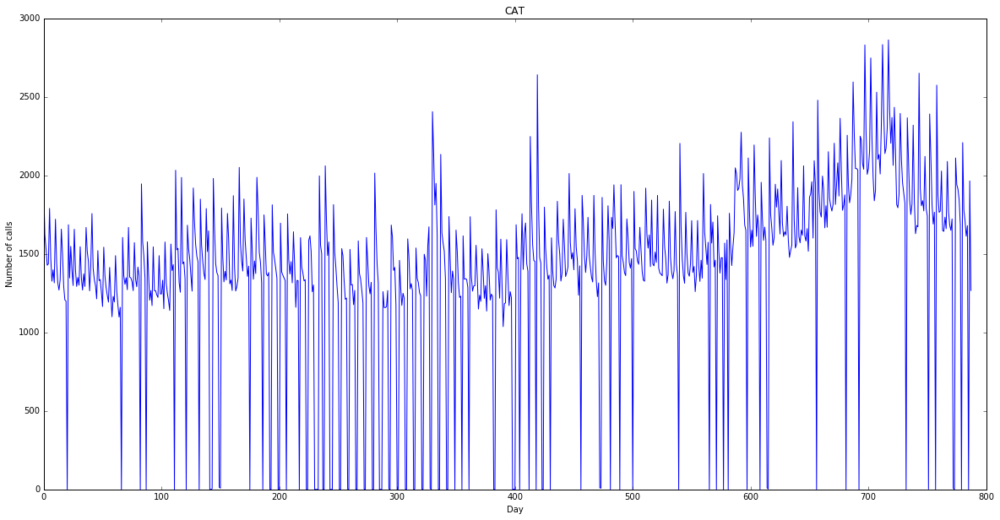

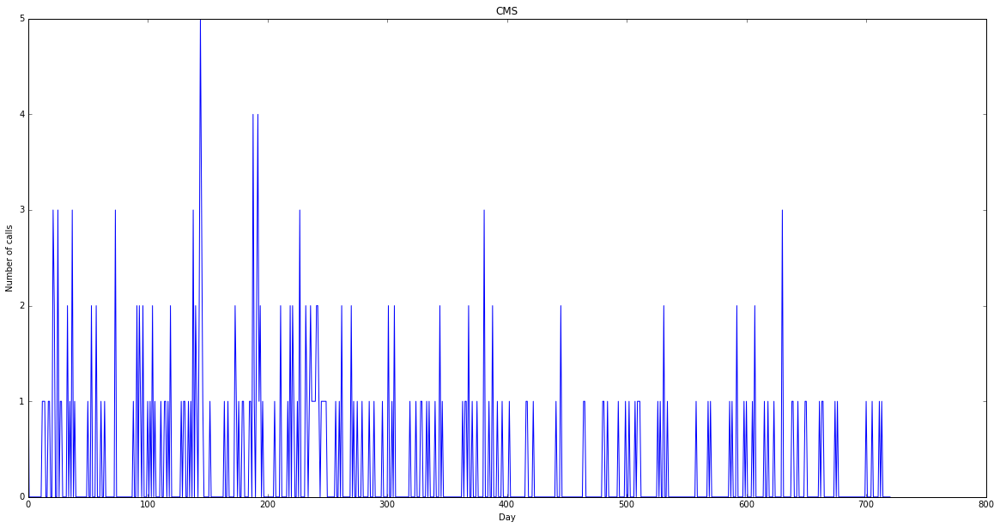

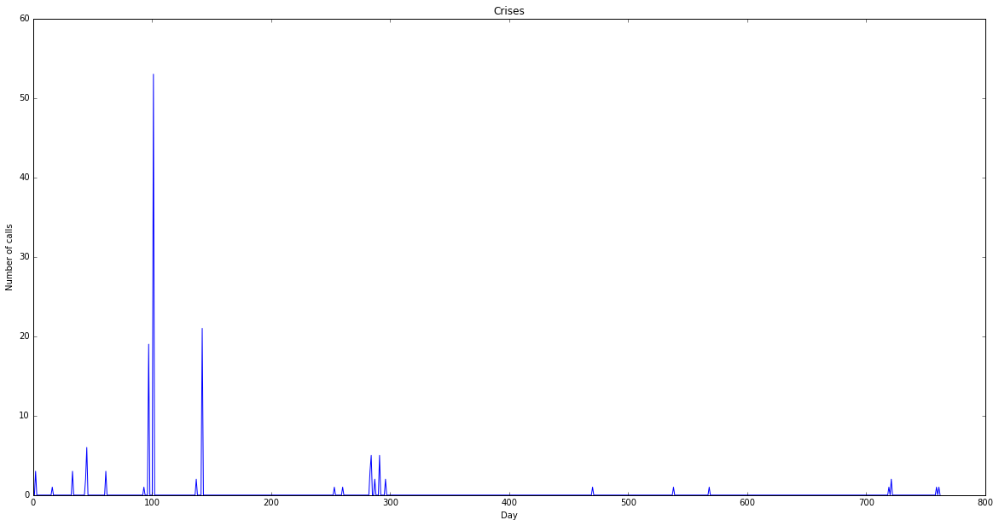

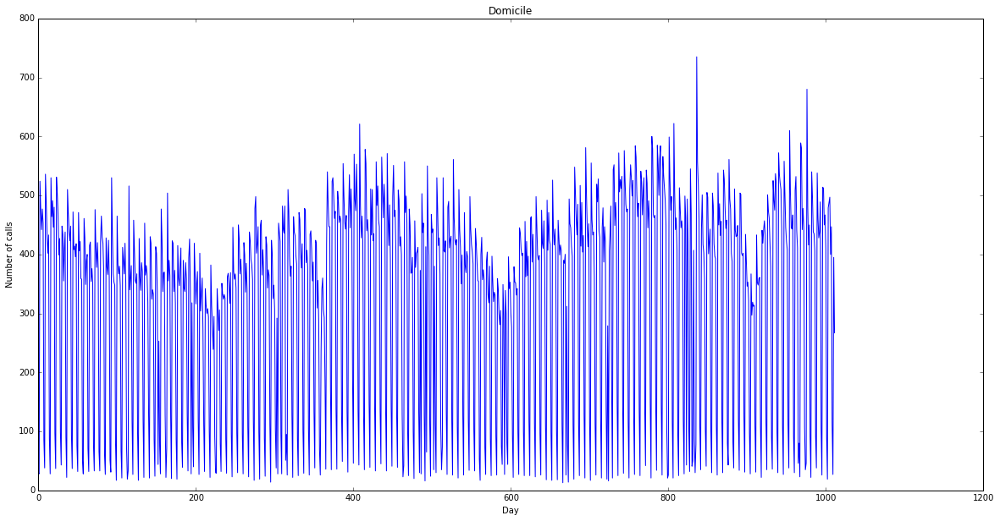

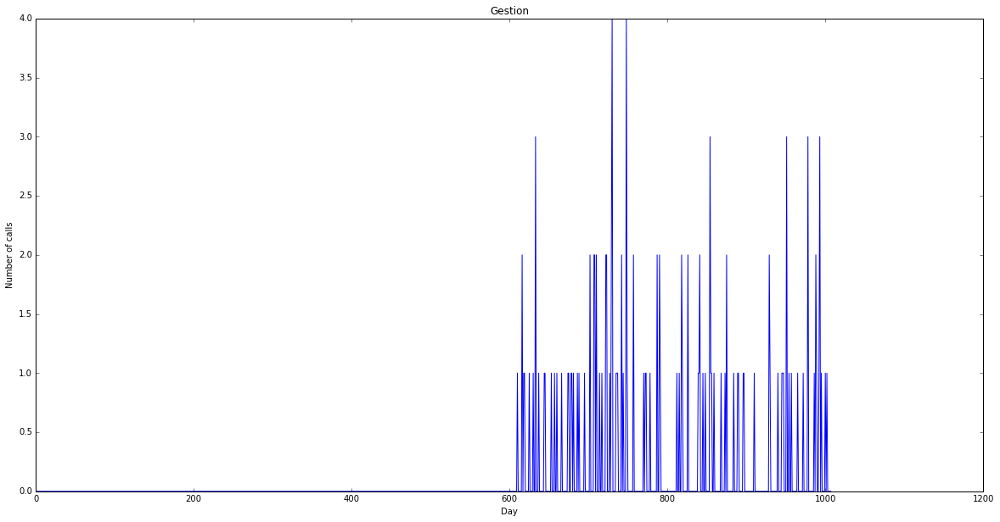

...

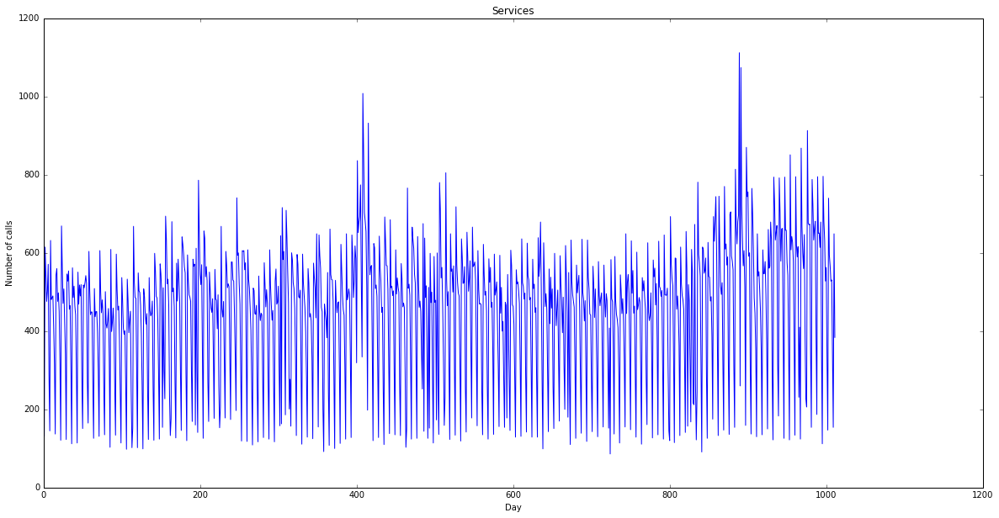

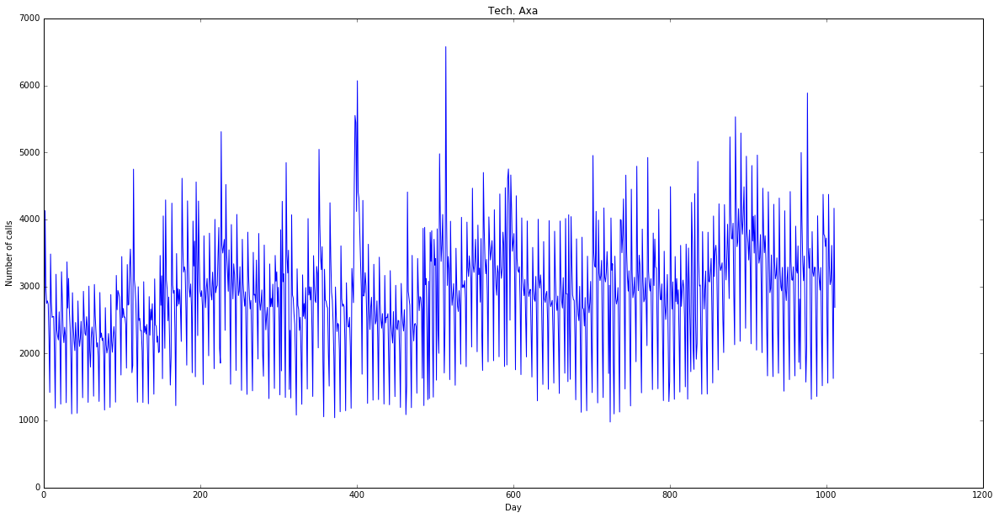

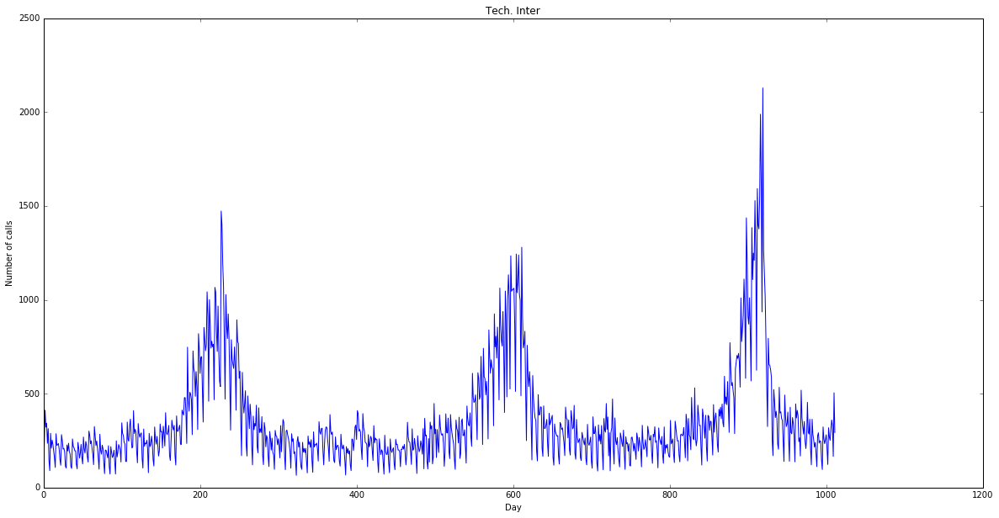

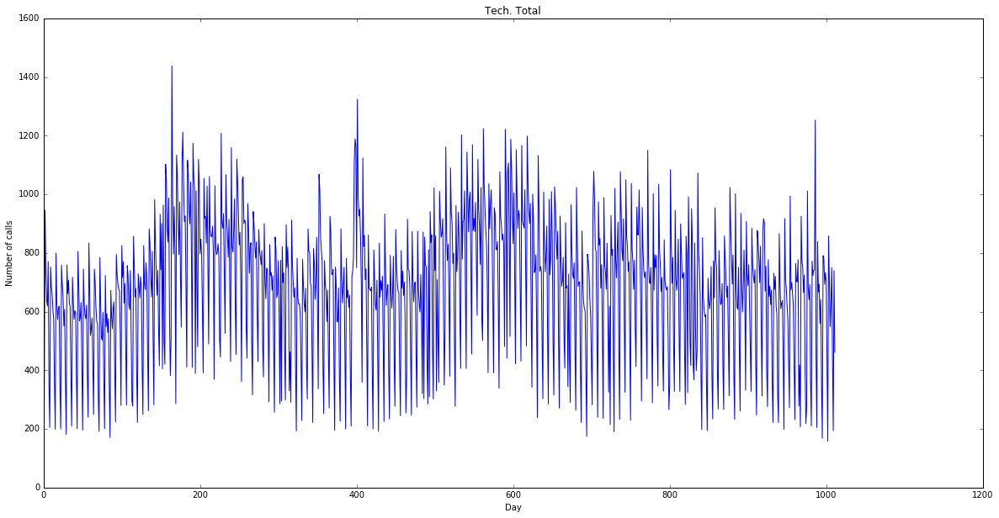

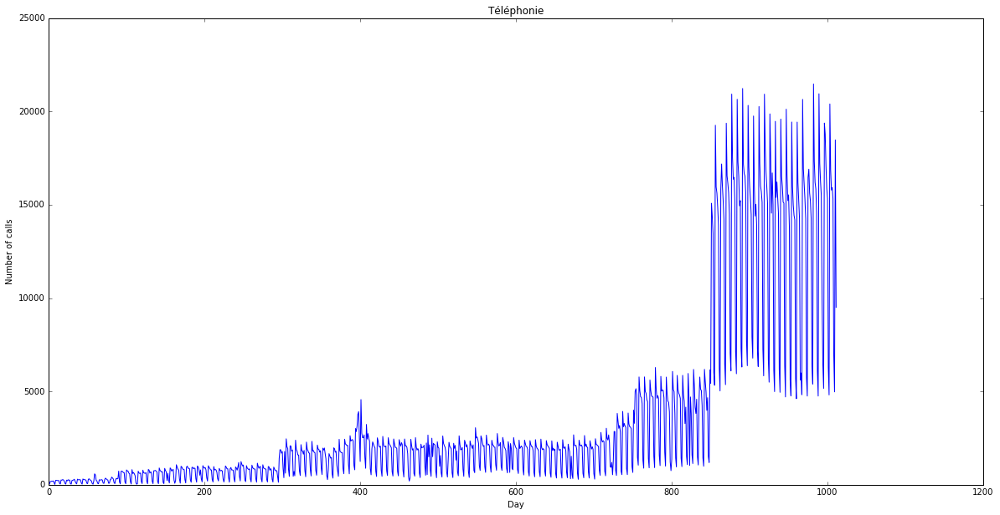

In [24]:
for class_lab in class_label:
    plt.figure(figsize=(20, 10))
    plt.plot(grouby_by_class_yearmonthday[class_lab].values)
    plt.xlabel('Day')
    plt.ylabel('Number of calls')
    plt.title(class_lab)

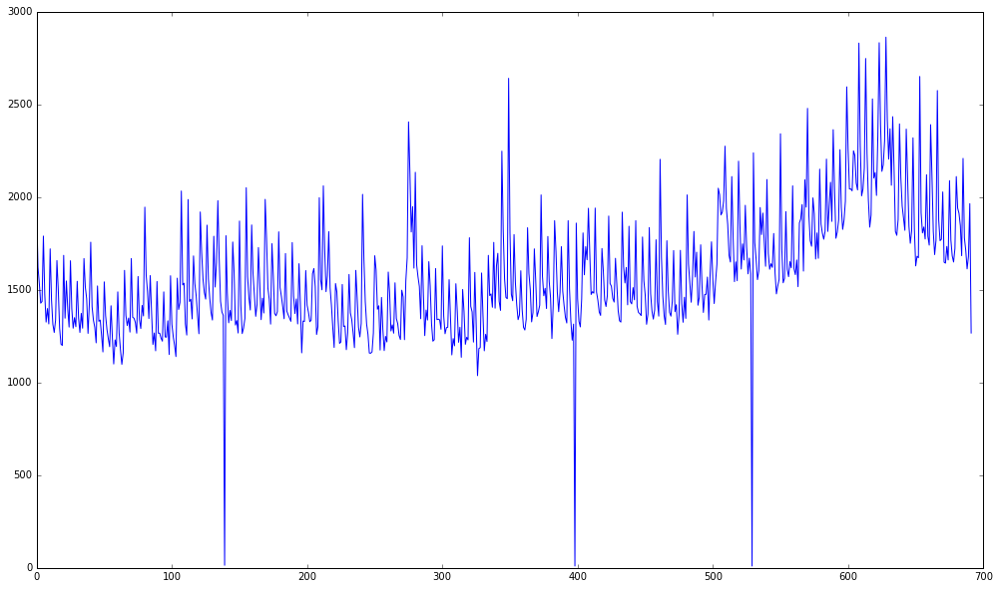

In [25]:
cat = data.loc[data.ASS_ASSIGNMENT == 'CAT']
cat_sunday = cat[cat.WEEKDAY.isin([str(i) for i in range(0, 8)])]
cc = cat_sunday.groupby(['YEAR_MONTH_DAY'])['CSPL_RECEIVED_CALLS'].sum()
dd = list(cc.loc[~(cc < 10)])
ee = pd.DataFrame(cc)
#print(len(np.unique(cat_sunday.YEAR_MONTH_DAY)))
#print(sum(cat_sunday.CSPL_RECEIVED_CALLS))
plt.figure(figsize=(17, 10))
plt.ylim((0, 3000))
plt.plot(dd)

#### Growths by year

In [26]:
dep2011 = data[data['YEAR']==2011].groupby(['ASS_ASSIGNMENT'])['CSPL_RECEIVED_CALLS'].sum()
dep2012 = data[data['YEAR']==2012].groupby(['ASS_ASSIGNMENT'])['CSPL_RECEIVED_CALLS'].sum()
dep2013 = data[data['YEAR']==2013].groupby(['ASS_ASSIGNMENT'])['CSPL_RECEIVED_CALLS'].sum()
#-----Growth by ASS_assignment--------------
var2011_2012=((dep2012-dep2011)/dep2011)*100
var2012_2013=((dep2013-dep2012)/dep2012)*100
CAGR2011_2013=((dep2013/dep2011)**0.5 -1)*100

#------Results--------------------------------
print("Growth 2011 -->2012 by ASS_ASSIGNEMENT")
print(var2011_2012)
print("-"*60)
print("Growth 2012 -->2013 by ASS_ASSIGNEMENT")
print(var2012_2013)
print("-"*60)
print("CAGR 2011 -->2013 by ASS_ASSIGNEMENT")
print(CAGR2011_2013)

#---------------------------Concatener pour visualiser sur un seul tableau ?????
#frames=[var2011_2012,var2012_2013,CAGR2011_2013]
#result = pd.concat(frames)
#print(result)


Growth 2011 -->2012 by ASS_ASSIGNEMENT
ASS_ASSIGNMENT
CAT                                 3.141019
CMS                               -54.477612
Crises                            -95.488722
Domicile                           10.313318
Gestion                                  inf
Gestion - Accueil Telephonique      9.991853
Gestion Assurances                 11.542161
Gestion Clients                    35.149218
Gestion DZ                         -2.590674
Gestion Relation Clienteles        28.163466
Gestion Renault                  -100.000000
Japon                               6.875872
Manager                           -30.880000
Mécanicien                         -1.390707
Médical                            -0.561189
Nuit                                2.113975
Prestataires                       -5.102041
RENAULT                           -27.177485
RTC                                -0.354661
Regulation Medicale               -18.098947
SAP                               -15.962906
S

#### Growths by month 

#### Growths by successive months (find the judicious period)

<h4>Date analysis</h4>

In [27]:
sub = pd.read_csv('../submission.txt', sep='\t')

In [28]:
# We apply the same transformation we applied for data
sub['DATE_SIMPLIFY'] = sub['DATE'].map(simplifyDATE)
sub['HOURMIN'] = sub['DATE_SIMPLIFY'].map(lambda x: x[8:])
getWeekDay(sub)
splitDate(sub)
getWeekEnd(sub)
getYearMonthDay(sub)
getDayAndNight(sub)

In [29]:
sub_by_class = {}
for class_lab in class_label:
    sub_by_class[class_lab] = sub.loc[sub.ASS_ASSIGNMENT==class_lab,:]

In [30]:
date_range = pd.date_range(start='2011-01-01', end='2013-12-31', freq='D')

In [31]:
date_str = []
for date_ in date_range:
    d = str(date_)
    date_str.append(int(d[:4]+d[5:7]+d[8:10]))

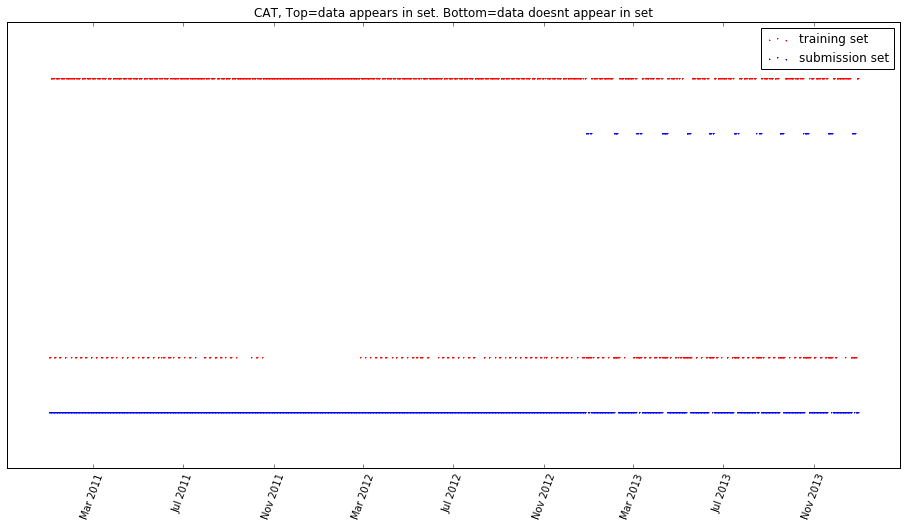

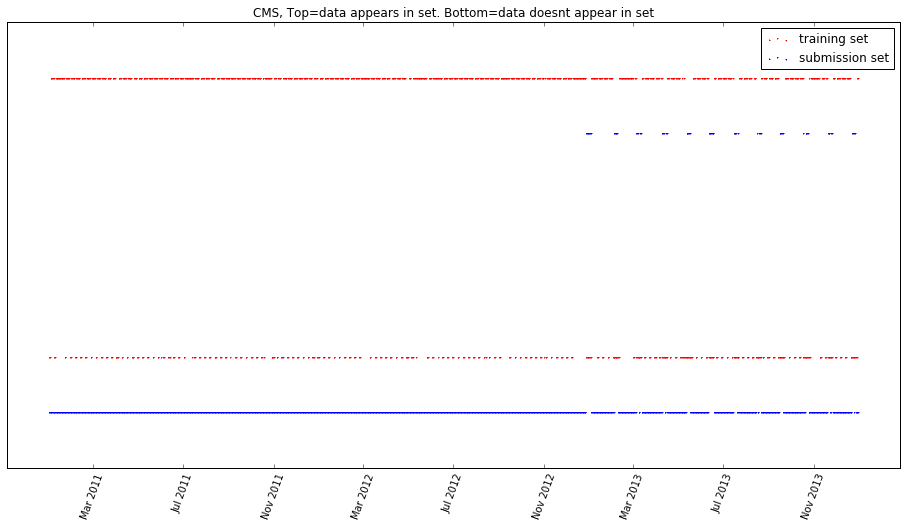

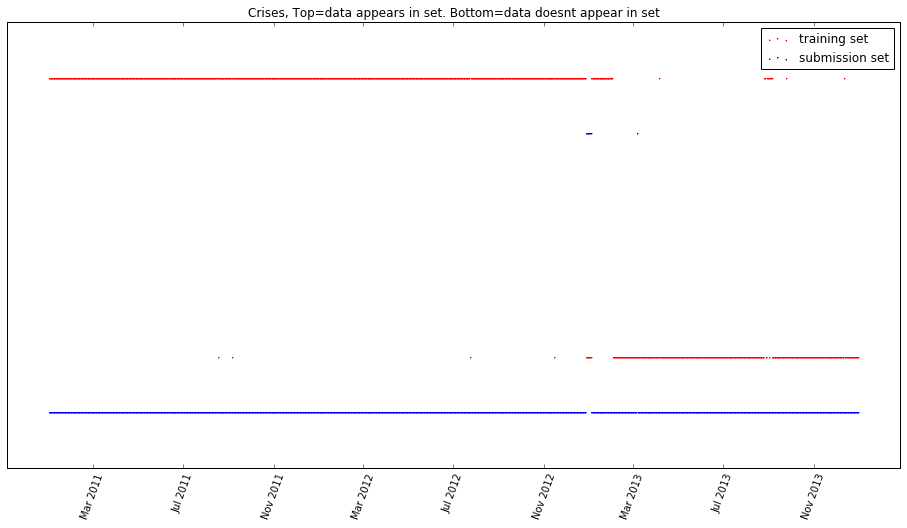

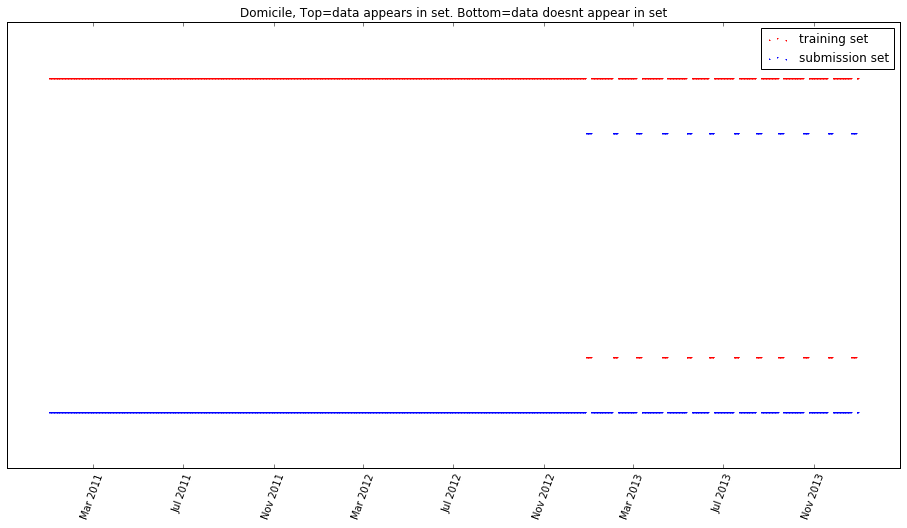

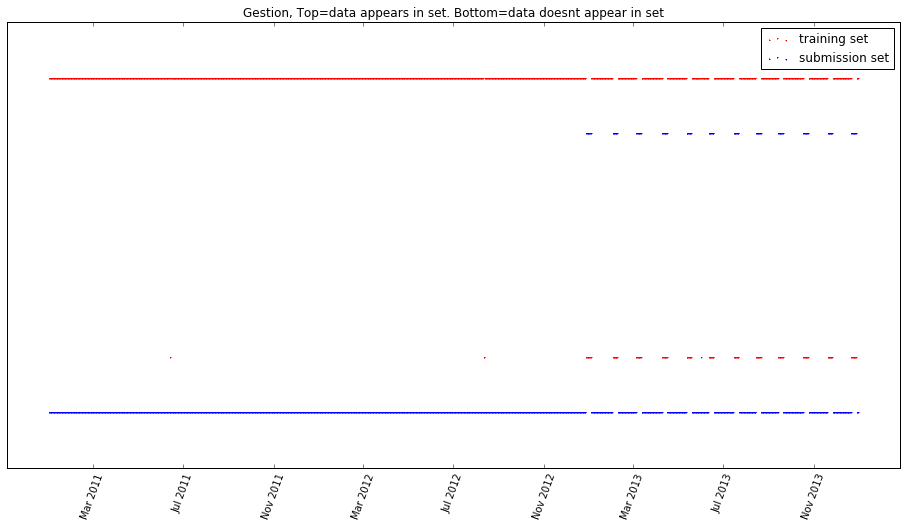

...

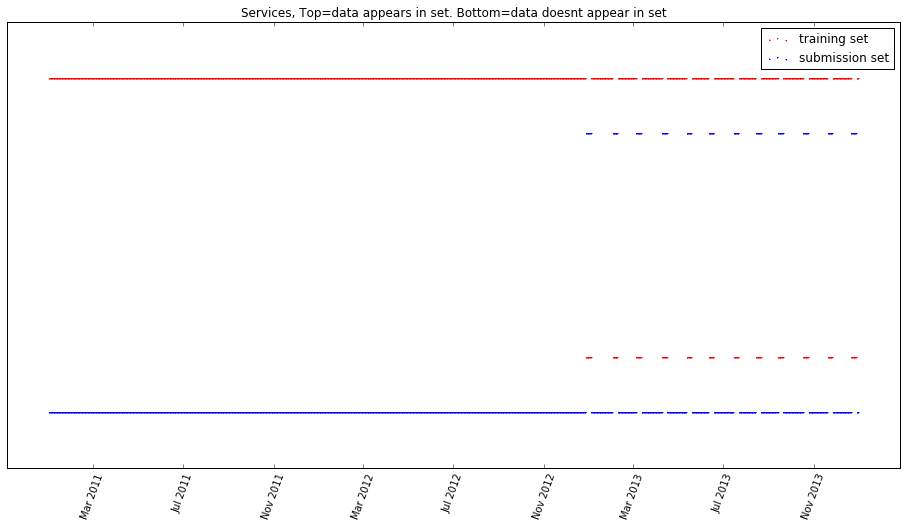

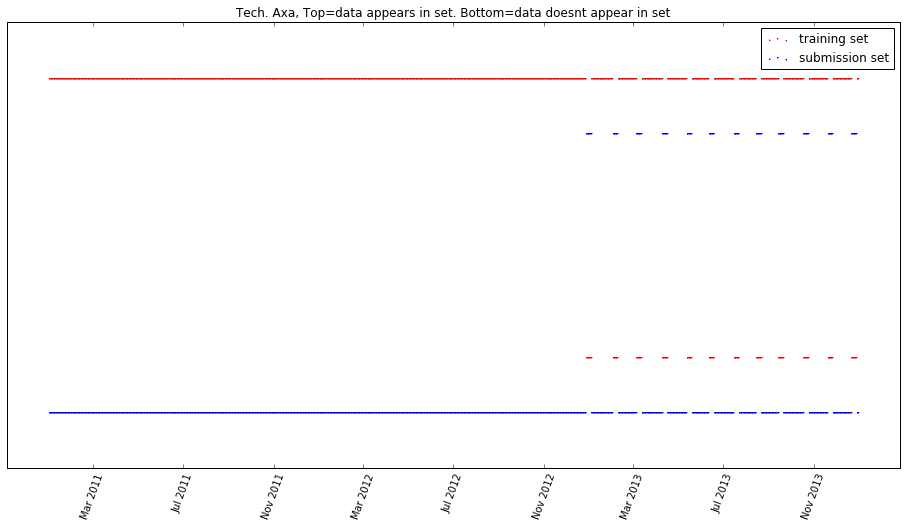

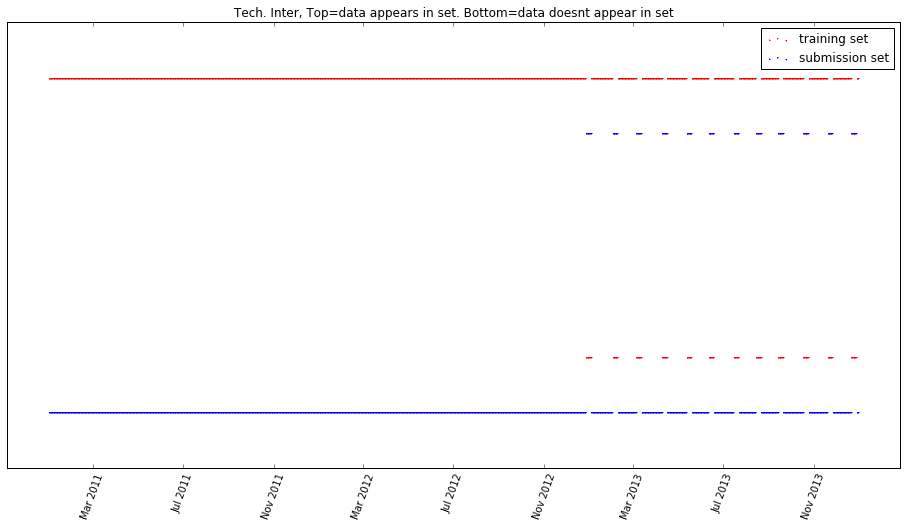

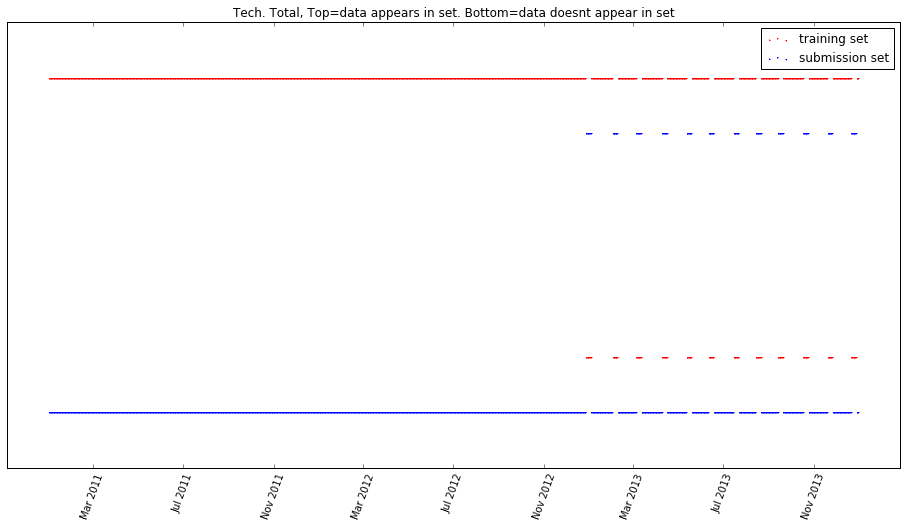

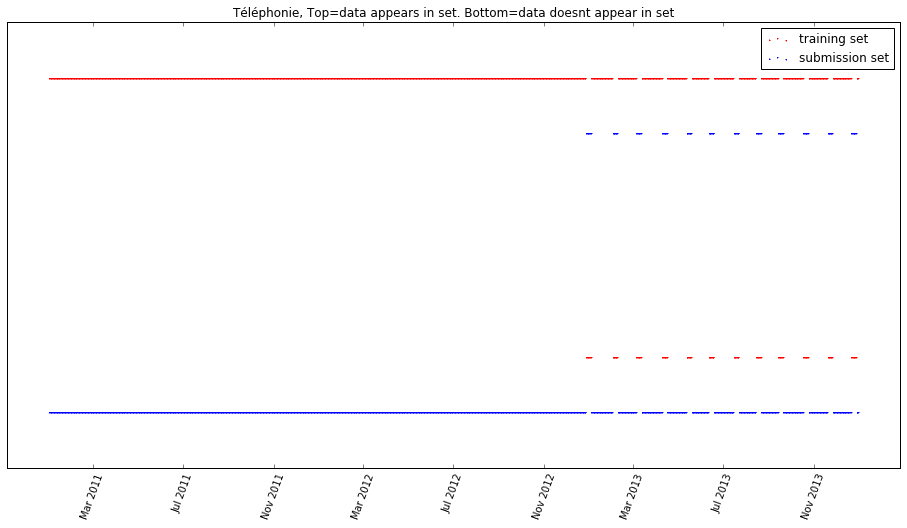

In [32]:
dates_by_class_data = {}
dates_by_class_weekday = {key:{i: 0 for i in range(7)} for key in class_label}
for item in data_by_class.items():
    res = []
    unique_dates_ = set(np.unique(item[1].YEAR_MONTH_DAY))
    for date_ in date_str:
        if date_ in unique_dates_:
            res.append(1)
        else:
            res.append(0)
            dates_by_class_weekday[item[0]][datetime.datetime(int(str(date_)[:4]), int(str(date_)[4:6]), int(str(date_)[6:8])).weekday()] += 1
    dates_by_class_data[item[0]] = res

dates_by_class_sub = {}
for item in sub_by_class.items():
    res = []
    unique_dates_ = set(np.unique(item[1].YEAR_MONTH_DAY))
    for date_ in date_str:
        if date_ in unique_dates_:
            res.append(0.8)
        else:
            res.append(-0.2)
    dates_by_class_sub[item[0]] = res

for class_lab in class_label:
    plt.figure(figsize=(16,8))
    plt.scatter(date_range, dates_by_class_data[class_lab], c='red', marker='+', s=1, label='training set')
    plt.scatter(date_range, dates_by_class_sub[class_lab], c='blue', marker='+', s=1, label='submission set')
    plt.legend()
    plt.xticks(rotation=70)
    plt.title('%s, Top=data appears in set. Bottom=data doesnt appear in set' %class_lab)
    plt.yticks([])
    plt.show()

In [33]:
# Missing days by ASS_ASSIGNMENT
dates_by_class_weekday

{'CAT': {0: 20, 1: 14, 2: 14, 3: 16, 4: 14, 5: 113, 6: 117},
 'CMS': {0: 22, 1: 16, 2: 15, 3: 16, 4: 19, 5: 144, 6: 143},
 'Crises': {0: 48, 1: 47, 2: 48, 3: 48, 4: 45, 5: 48, 6: 49},
 'Domicile': {0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 12, 6: 12},
 'Gestion': {0: 13, 1: 12, 2: 12, 3: 12, 4: 12, 5: 13, 6: 14},
 'Gestion - Accueil Telephonique': {0: 15,
  1: 13,
  2: 12,
  3: 13,
  4: 13,
  5: 17,
  6: 18},
 'Gestion Assurances': {0: 16, 1: 14, 2: 13, 3: 17, 4: 18, 5: 47, 6: 47},
 'Gestion Clients': {0: 18, 1: 15, 2: 14, 3: 16, 4: 17, 5: 77, 6: 78},
 'Gestion DZ': {0: 19, 1: 16, 2: 14, 3: 16, 4: 17, 5: 86, 6: 86},
 'Gestion Relation Clienteles': {0: 18,
  1: 15,
  2: 13,
  3: 16,
  4: 16,
  5: 98,
  6: 97},
 'Gestion Renault': {0: 15, 1: 13, 2: 12, 3: 13, 4: 13, 5: 22, 6: 22},
 'Japon': {0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 12, 6: 12},
 'Manager': {0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 12, 6: 12},
 'Mécanicien': {0: 12, 1: 12, 2: 12, 3: 12, 4: 12, 5: 15, 6: 42},
 'Médical': {0: 12, 1: 1

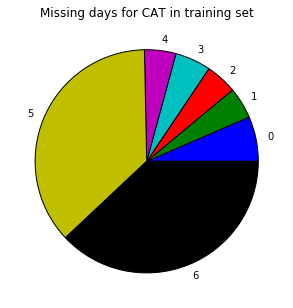

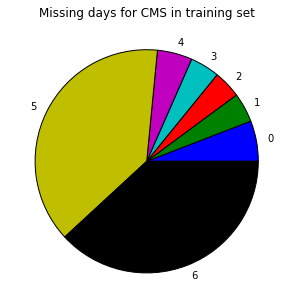

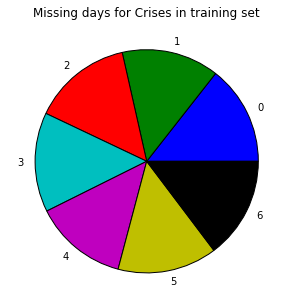

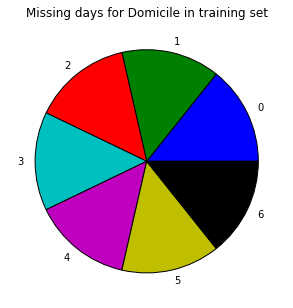

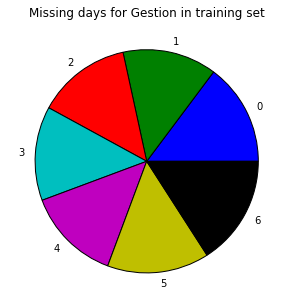

...

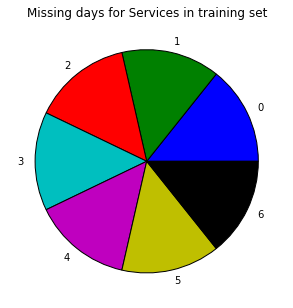

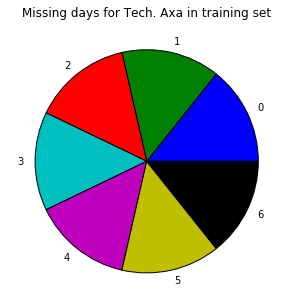

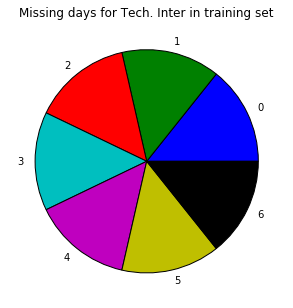

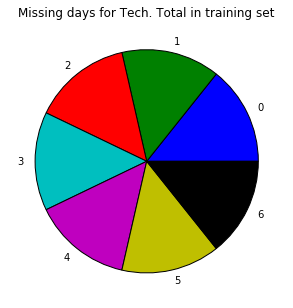

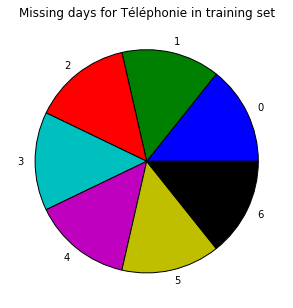

In [34]:
for class_lab in class_label:
    plt.figure(figsize=(5, 5))
    plt.pie(np.array(sorted(list(dates_by_class_weekday[class_lab].items()), key=lambda x: x[0]))[:,1], labels=[0, 1, 2, 3, 4, 5, 6])
    plt.title("Missing days for %s in training set" %class_lab)
    plt.show()

In [35]:
hours_in_assignment = {key:[] for key in class_label}
groupby_hourmin_assignment = data.groupby((['YEAR_MONTH_DAY', 'ASS_ASSIGNMENT']))['HOURMIN'].count()
for date_ in date_str:
    for class_lab in class_label:
        if date_ in groupby_hourmin_assignment and class_lab in groupby_hourmin_assignment[date_]:
            hours_in_assignment[class_lab].append(groupby_hourmin_assignment[date_][class_lab]/48.)
        else:
            hours_in_assignment[class_lab].append(0)

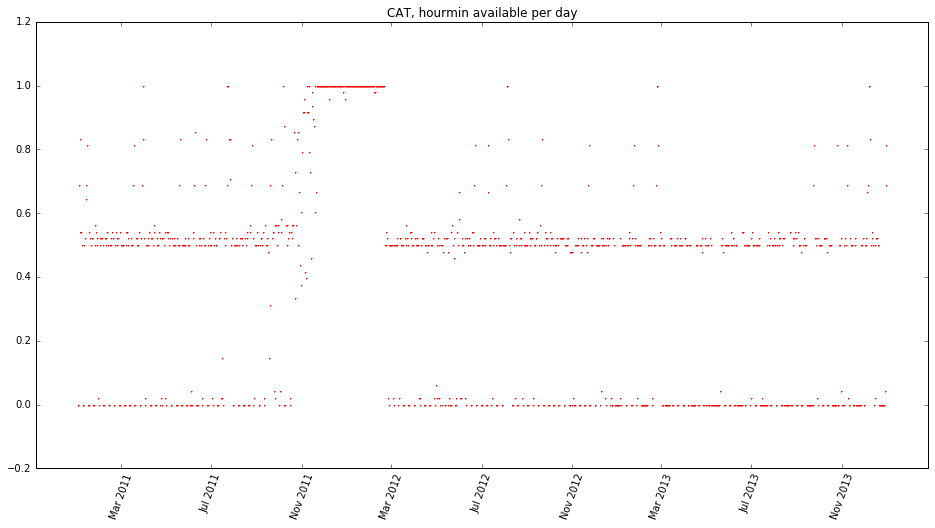

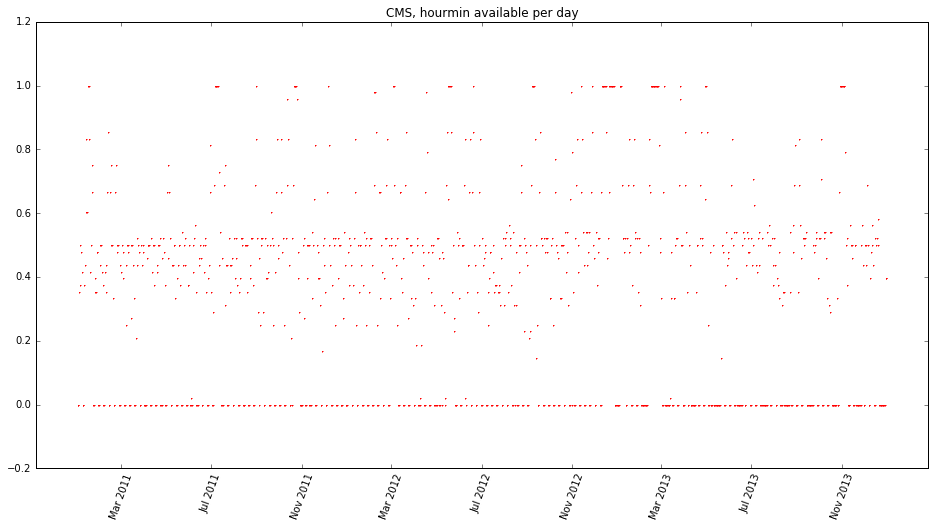

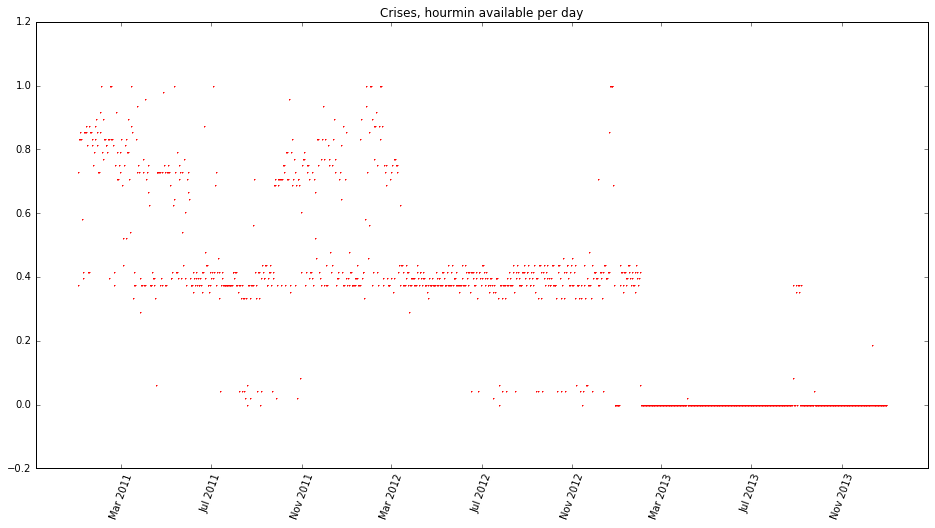

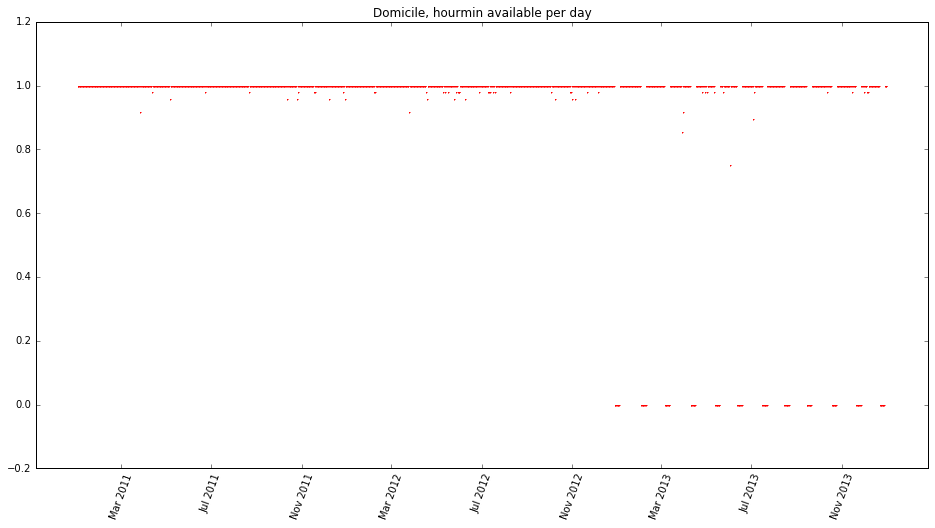

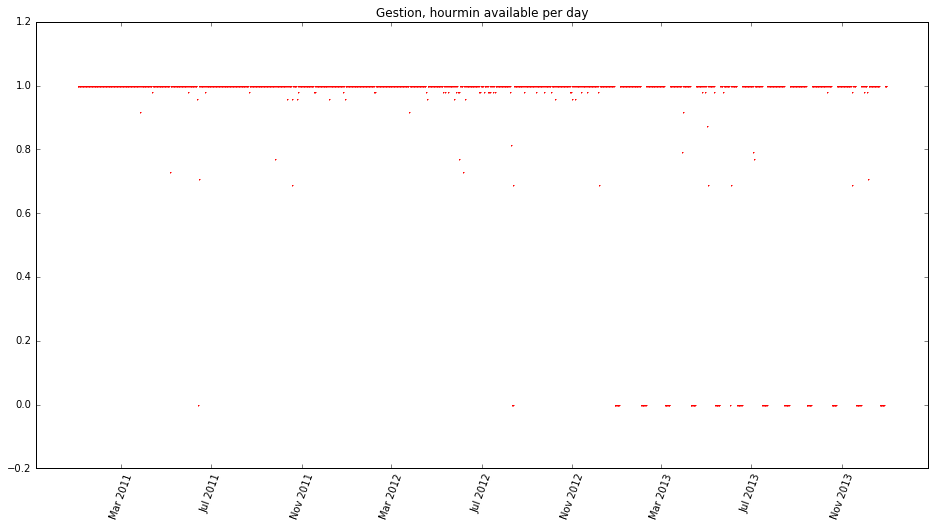

...

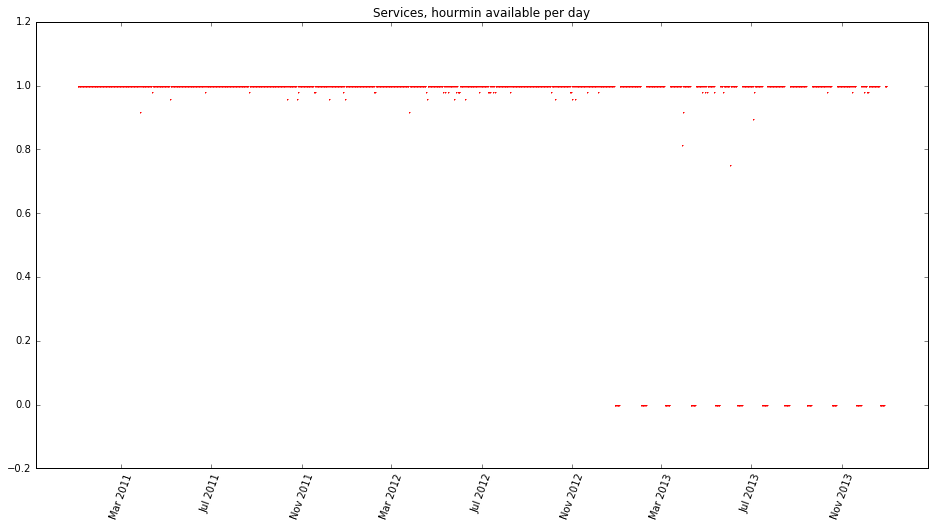

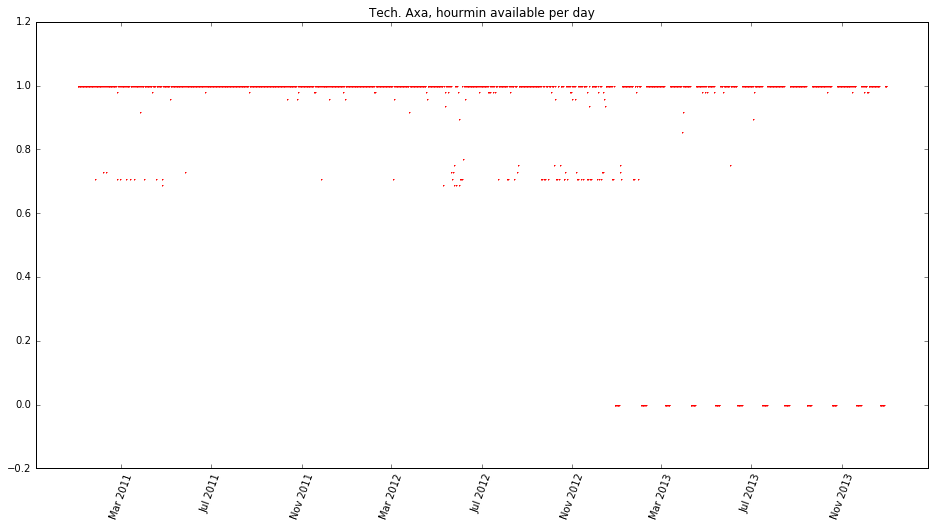

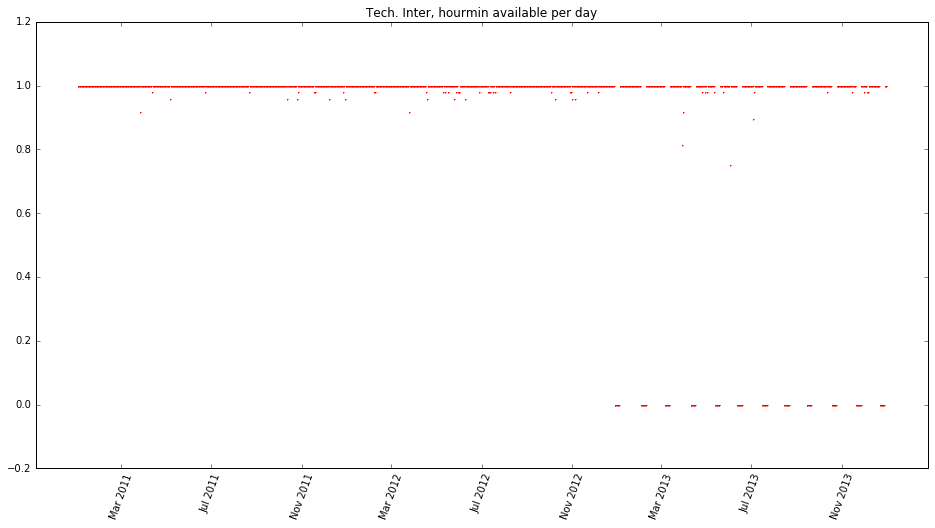

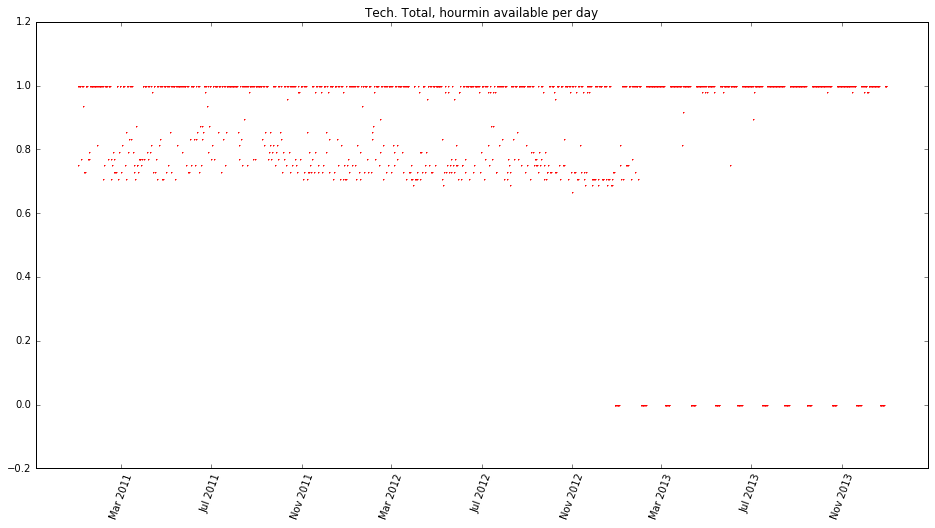

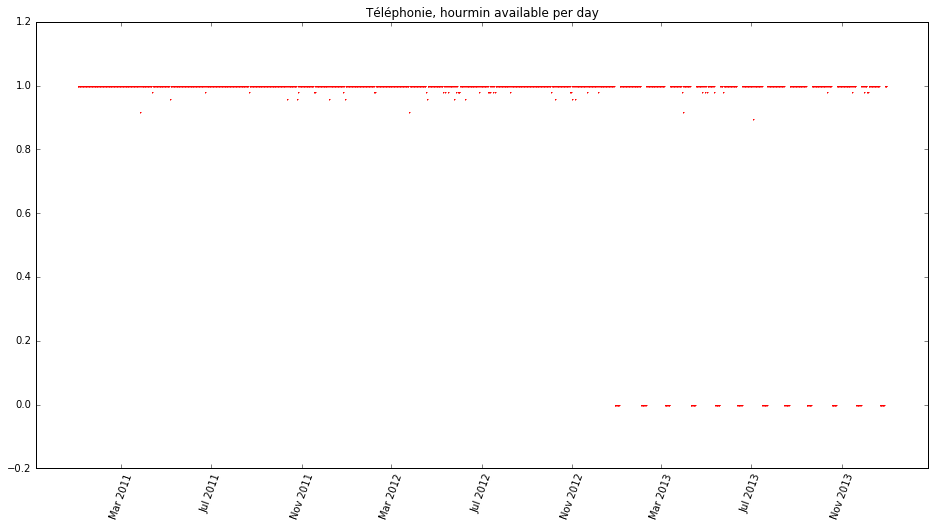

In [36]:
for class_lab in class_label:
    plt.figure(figsize=(16,8))
    plt.scatter(date_range, hours_in_assignment[class_lab], c='red', marker='+', s=1)
    plt.legend()
    plt.xticks(rotation=70)
    plt.title('%s, hourmin available per day' %class_lab)
    plt.show()

In [37]:
assignment_hourmin_count = data.groupby((['ASS_ASSIGNMENT', 'HOURMIN'])).DATE.count()

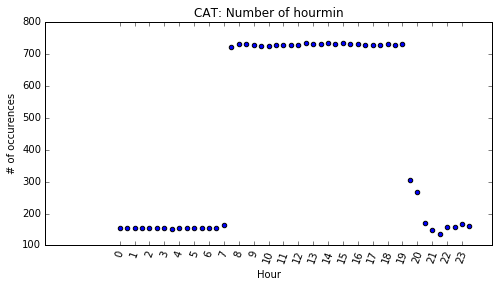

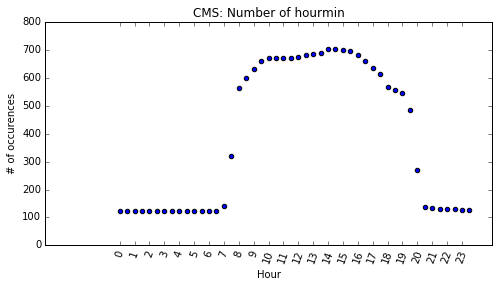

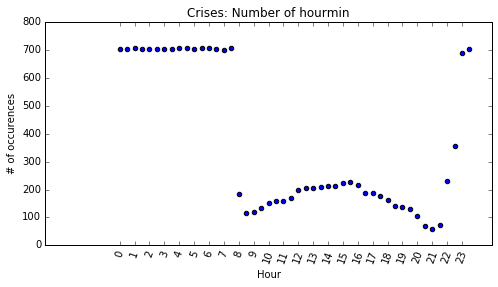

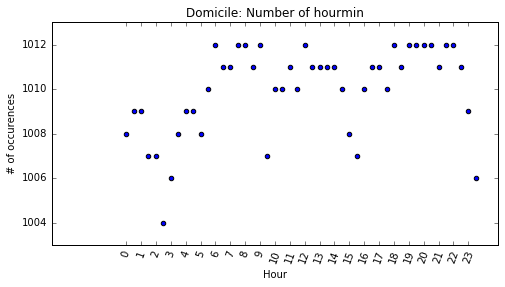

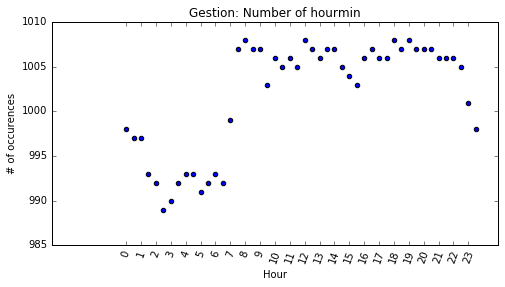

...

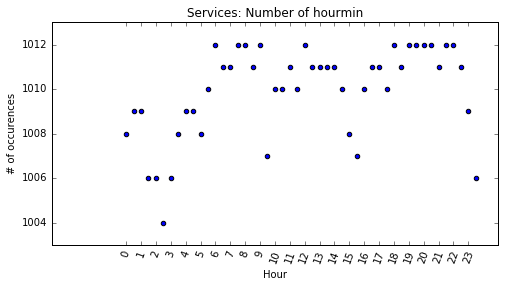

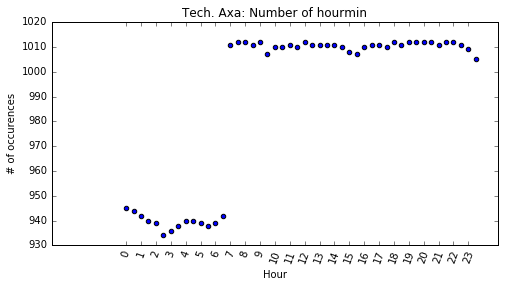

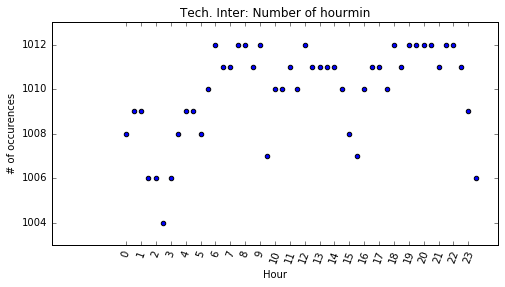

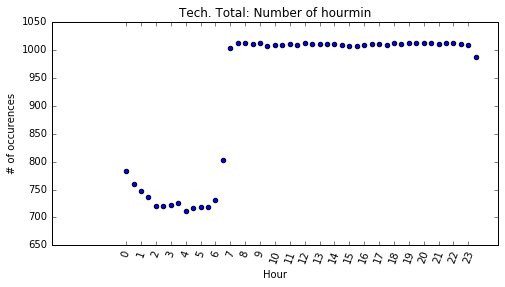

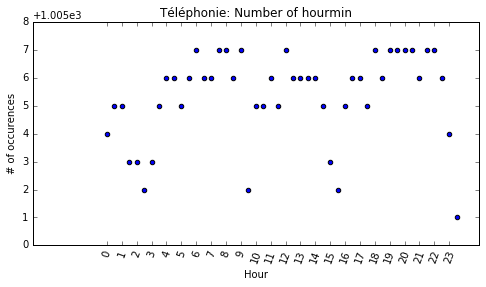

In [38]:
for class_lab in class_label:
    arr = np.array(list(assignment_hourmin_count[class_lab].items()))
    hourmin = arr[:,0]
    quant = arr[:,1]
    plt.figure(figsize=(8, 4))
    plt.scatter(range(48), quant)
    plt.title("%s: Number of hourmin" %class_lab)
    plt.xticks([2*i for i in range(24)], [i for i in range(24)], rotation=70)
    plt.xlabel('Hour')
    plt.ylabel("# of occurences")
    plt.show()

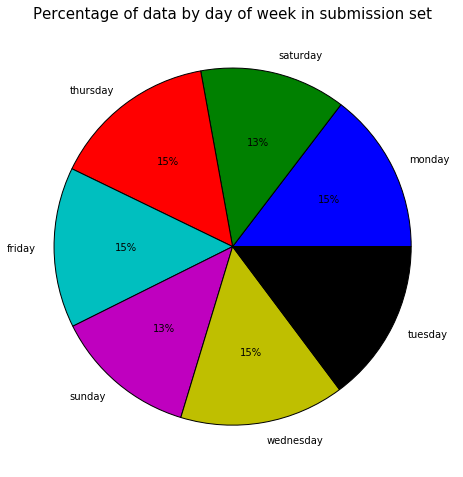

In [39]:
mapping_day = {0: 'monday', 1: 'tuesday', 2: 'wednesday', 3: 'thursday', 4: 'friday', 5: 'saturday',  6: 'sunday'}
counter_weekday_testset = np.array(list(Counter(sub.WEEKDAY).items()))
counter_weekday_values, counter_weekday_days = [int(x) for x in counter_weekday_testset[:,1]], counter_weekday_testset[:,0]
plt.figure(figsize=(8, 8))
plt.pie(counter_weekday_values, labels=[mapping_day[int(x)] for x in counter_weekday_days], autopct='%1.0f%%')
plt.title("Percentage of data by day of week in submission set", fontsize=15)
plt.show()

In [40]:
c = Counter(sub.ASS_ASSIGNMENT)
print("%-*s |%-*s |%s" %(30, "Service", 34, '# occurences in submission set', 'Percentage'))
print("-"*80)
for t in sorted(list(c.items()), key=lambda x: -x[1]):
    print("%-*s |%-*s |%.2f %%" %(30, t[0], 34,  t[1], 100*t[1]/sum(c.values())))

Service                        |# occurences in submission set     |Percentage
--------------------------------------------------------------------------------
Téléphonie                     |4028                               |4.86 %
Tech. Inter                    |4025                               |4.85 %
Nuit                           |4025                               |4.85 %
RENAULT                        |4025                               |4.85 %
Domicile                       |4024                               |4.85 %
Médical                        |4024                               |4.85 %
Services                       |4024                               |4.85 %
Japon                          |4008                               |4.83 %
Tech. Axa                      |3997                               |4.82 %
Gestion                        |3988                               |4.81 %
Tech. Total                    |3936                               |4.75 %
Gestion - Accue

### 3.2 Holidays Analysis

In [41]:
def ferie(x):
    if (x=='20110101' or x=='20110424' or x=='20110425' or x=='20110501' or x=='20110508' or x=='20110602' or x=='20110612' 
        or x=='20110613' or x=='20110714' or x=='20110815' or x=='20111101' or x=='20111111' or x=='20111225' or
        x=='20120101' or x=='20120408' or x=='20120409' or x=='20120501' or x=='20120508' or x=='20120517' or x=='20120527' 
        or x=='20120528' or x=='20120714' or x=='20120815' or x=='20121101' or x=='20121111' or x=='20121225' or
        x=='20130101' or x=='20130331' or x=='20130401' or x=='20130501' or x=='20130508' or x=='20130509' or x=='20130519' 
        or x=='20130520' or x=='20130714' or x=='20130815' or x=='20131101' or x=='20131111' or x=='20131225'):

        res = 1
    else:
        res = 0
    return res


In [42]:
data['IS_HOLIDAY?'] = data['YEAR_MONTH_DAY'].map(ferie)

In [43]:
data.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS,DATE_SIMPLIFY,HOURMIN,WEEKDAY,YEAR,MONTH,DAY,HOUR,...,YEAR_MONTH_DAY,NIGHT,WEEKDAY0,WEEKDAY1,WEEKDAY2,WEEKDAY3,WEEKDAY4,WEEKDAY5,WEEKDAY6,IS_HOLIDAY?
0,2011-01-01 00:00:00.000,Crises,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,2011-01-01 00:00:00.000,Domicile,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,2011-01-01 00:00:00.000,Gestion,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
3,2011-01-01 00:00:00.000,Gestion - Accueil Telephonique,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
5,2011-01-01 00:00:00.000,Gestion Assurances,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [44]:
#plot graphs : 1/ moyenne des appels par jour férié et non férié sur même graphe par sevice (graphe pr chaque service)
#2/evolution de la somme d'appels par jour férié sur les 3 ans (graphe pr chaque j férié)

In [45]:
def addZero(x):
    return '0' + str(x) if x < 10 else str(x)

mappingHourMin = {addZero(hour) + mn: 2*index_hour + index_mn for index_hour, hour in enumerate(range(24)) for index_mn, mn in enumerate(['00', '30'])}

def getMappingHourmin(x):
    return mappingHourMin[x]

def getNumberDaysSinceBeg(date):
    return (datetime.date(int(str(date)[:4]), int(str(date)[4:6]), int(str(date)[6:8])) - datetime.date(2011, 1, 1)).days

def isAfterHoliday(date):
    if ferie(str(int(date-1))) == 1 and getWeekDay(str(int(date)))!= 5 and getWeekDay(str(int(date)))!= 6 and ferie(str(int(date))) == 0:
        return 1
    return 0

def getWeekDay(date):
    return datetime.datetime(int(str(date)[:4]), int(str(date)[4:6]), int(str(date)[6:8])).weekday()

def getColor(i):
    if isAfterHoliday(i):
        # Lendemain de jour férié
        return 'red'
    elif getWeekDay(str(i))==0:
        # Lundi
        return 'orange'
    elif ferie(i)==1 or getWeekDay(str(i))==6:
        #Dimanche ou jour férié
        return 'white'
    elif getWeekDay(str(i))==5 :
        # Samedi
        return 'white'
    else:
        # Autres
        return 'blue'
    
def getAllDates(withHourMin=True, start_date='2011-01-01', end_date='2013-12-31'):
    if withHourMin:
        for ymd in pd.date_range(start=start_date, end=end_date, freq='D'):
            for h in [addZero(i) for i in range(24)]:
                for m in ['00', '30']:
                    yield str(ymd.year) + addZero(ymd.month) + addZero(ymd.day) + h + m
    else:
        for ymd in pd.date_range(start=start_date, end=end_date, freq='D'):
            yield str(ymd.year) + addZero(ymd.month) + addZero(ymd.day)

def fromDATE_SIMPLIFYtoDATE(ds):
    s = str(ds)
    return s[:4]+'-'+s[4:6]+'-'+s[6:8]+' '+s[8:10]+':'+s[10:12]+':00.000'

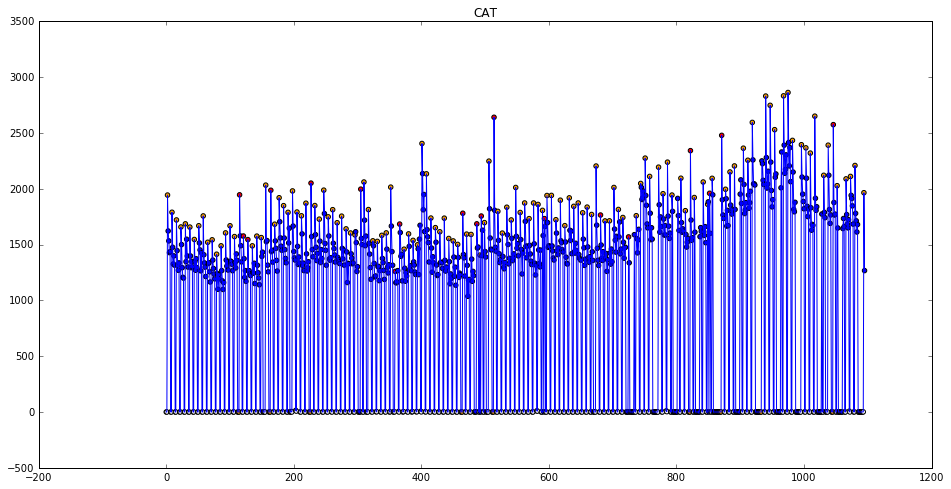

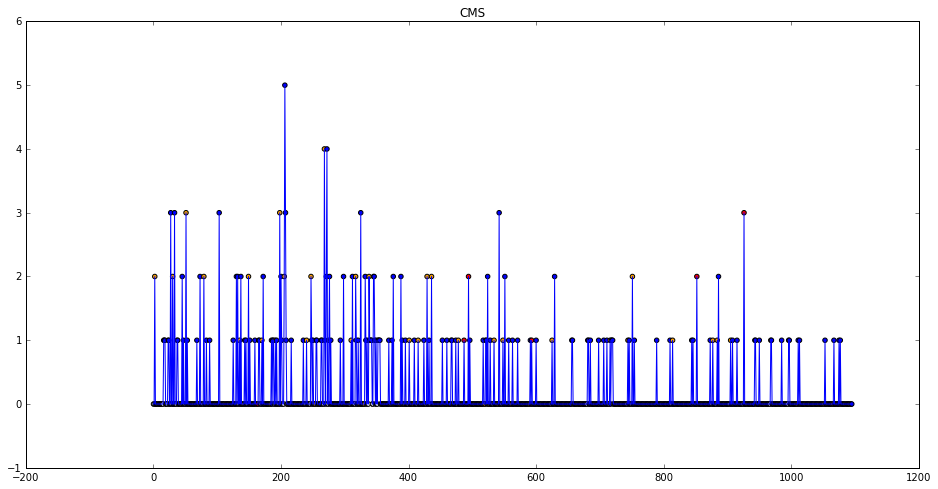

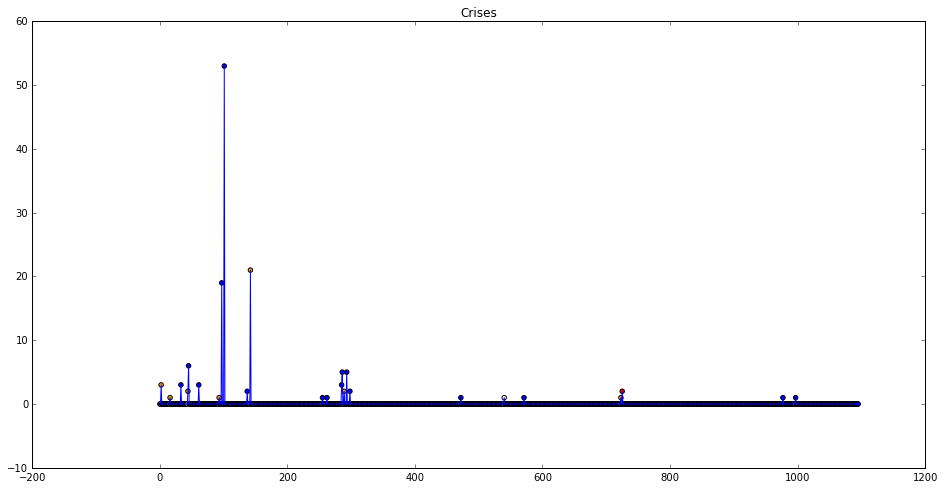

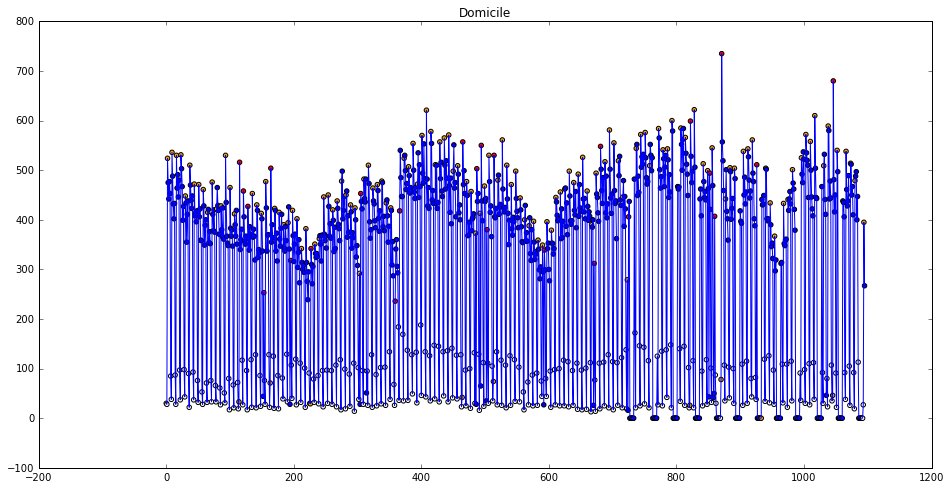

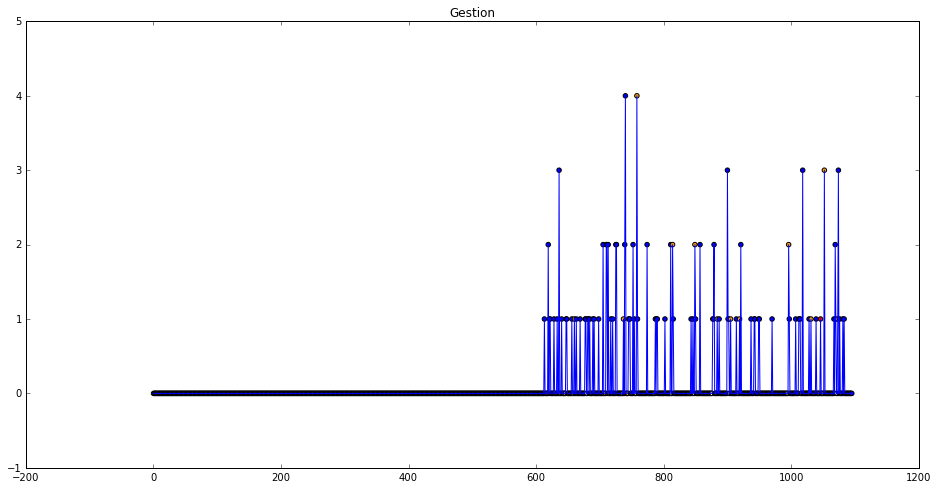

...

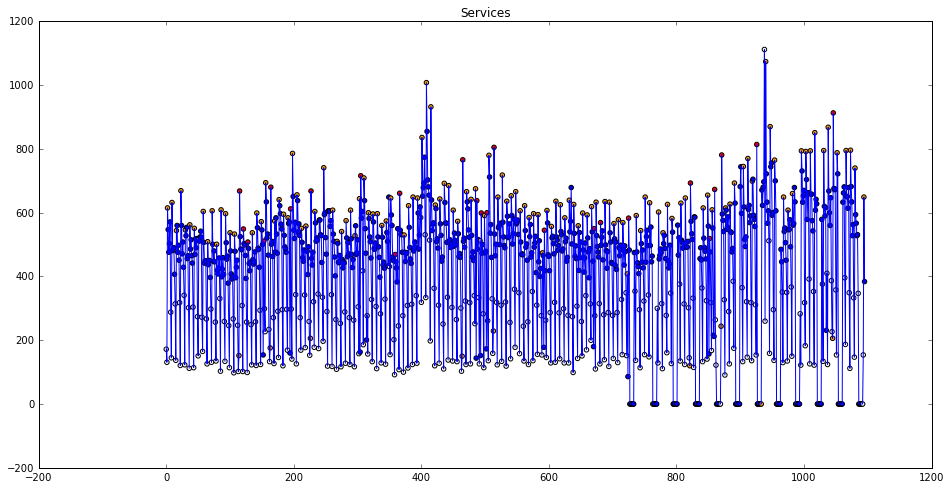

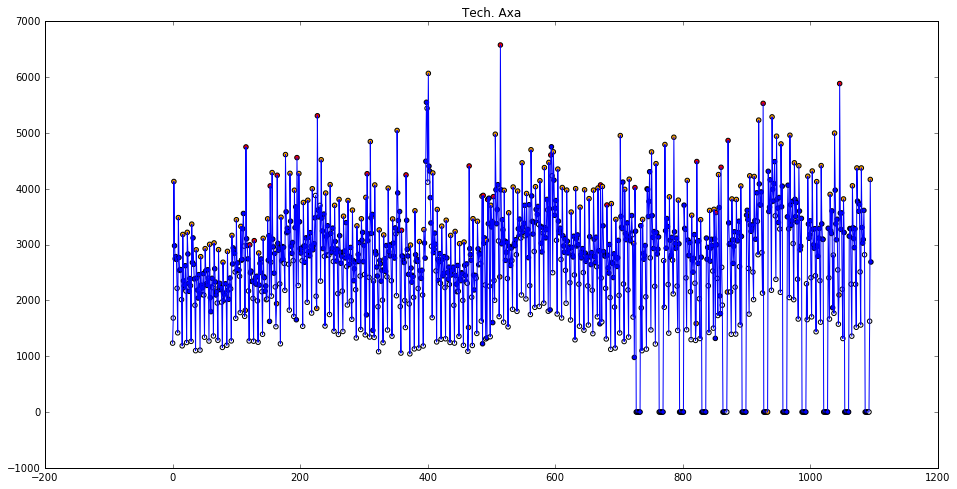

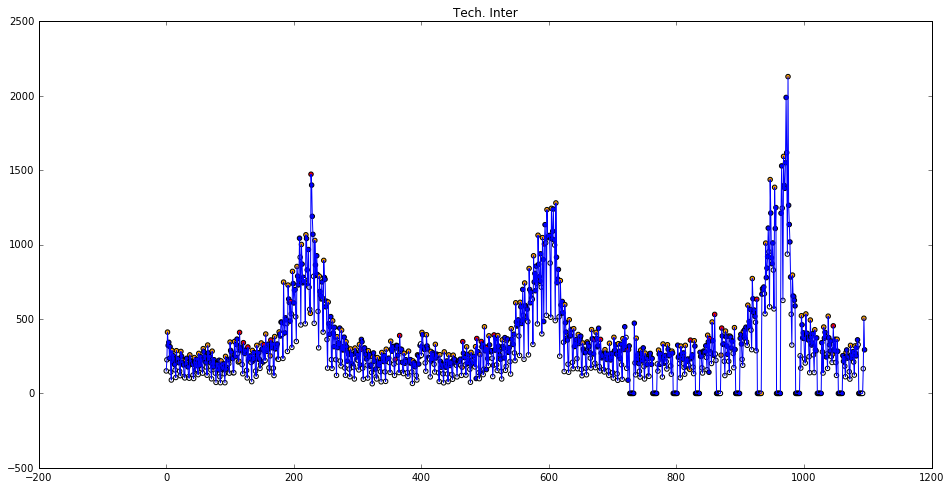

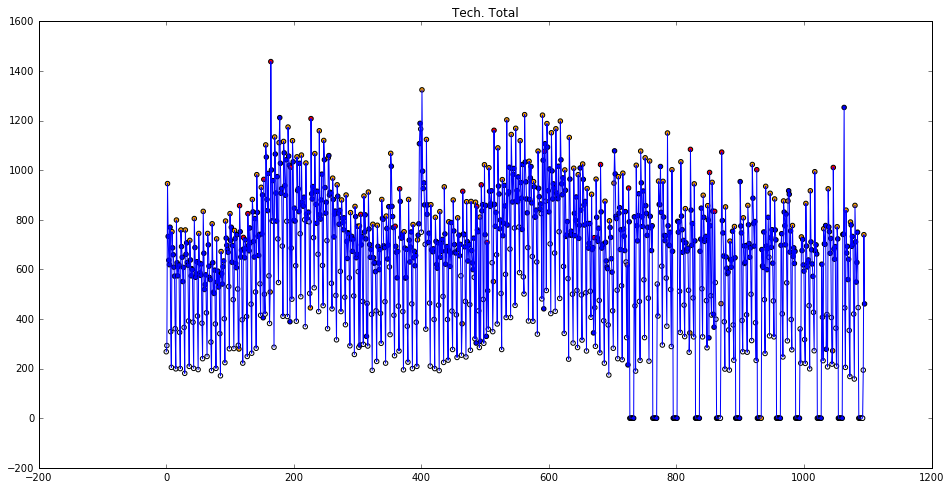

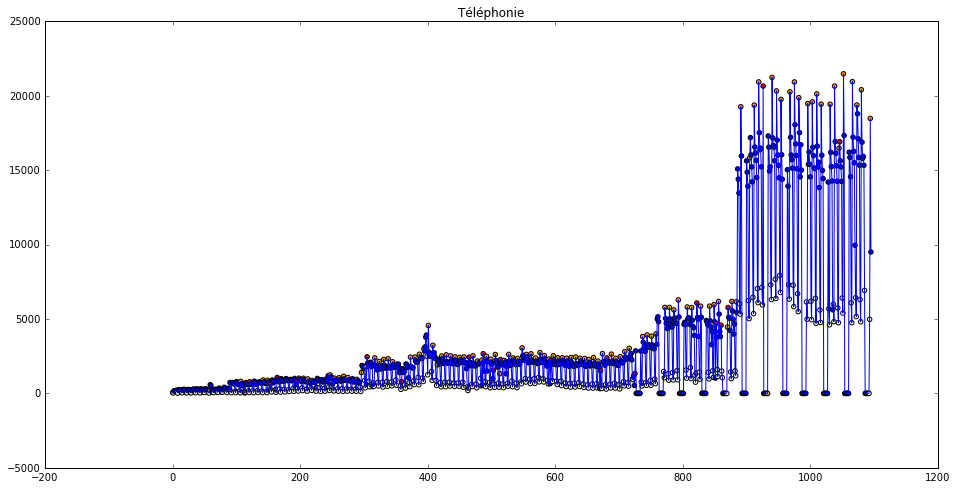

In [46]:
### Permet de se rendre compte que les jours fériés, les week end reçoivent pas d'appels la plupart du temps et que 
### les lendemains de week end et de jours fériés en reçoivent beaucoup
for class_lab in class_label:
    data_label = data.loc[data.ASS_ASSIGNMENT == class_lab]
    data_label_group_by = data_label.groupby(['YEAR_MONTH_DAY'])['CSPL_RECEIVED_CALLS'].sum()

    dates_ = []
    values_ = []
    date_in_data_label = set([str(x) for x in data_label_group_by.index])
    for date in getAllDates(withHourMin=False, end_date='2013-12-31'):
        dates_.append(int(date))
        if date in date_in_data_label:
            values_.append(data_label_group_by[int(date)])
        else:
            values_.append(0)

    plt.figure(figsize=(16, 8))
    plt.plot(range(len(dates_)), values_)
    plt.scatter(range(len(dates_)), values_, c=[getColor(i) for i in (dates_)])
    plt.title(class_lab)
    plt.show()

<h1>4. Prediction</h1>

In [47]:
def getX_Y(data, columns_X):
    X, y = data[columns_X].values, data['CSPL_RECEIVED_CALLS'].values
    return X, y

def getX(data, columns_X):
    X = data[columns_X].values
    return X

In [48]:
def score(y_true_list, y_pred_list):
    alpha = 0.1
    return np.mean([np.exp(alpha*(y_true - y_pred)) - alpha*(y_true - y_pred) - 1 for (y_true, y_pred) in zip(y_true_list, y_pred_list)])

In [49]:
def split(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    return X_train, X_test, y_train, y_test

In [50]:
def save(data, title):
    data.to_csv(title + '.txt', sep='\t', index=False)

In [51]:
def tranformData(data):
    if not 'DATE_SIMPLIFY' in data.columns:
        data['DATE_SIMPLIFY'] = data['DATE'].map(simplifyDATE)
    data['DATE_SIMPLIFY'] = data['DATE_SIMPLIFY'].map(lambda x: str(x))
    data['HOURMIN'] = data['DATE_SIMPLIFY'].map(lambda x: x[8:])
    data['WEEKDAY'] = data['DATE_SIMPLIFY'].map(getWeekDay)
    data['HOLIDAY'] = data['DATE_SIMPLIFY'].map(ferie)
    splitDate(data)
    getWeekEnd(data)
    getYearMonthDay(data)
    data['IS_AFTER_HOLIDAY'] = data['YEAR_MONTH_DAY'].map(isAfterHoliday)
    data['HOURMIN_HL'] = data['HOURMIN'].map(getMappingHourmin)
    data['DAYS_SINCE_BEG'] = data['YEAR_MONTH_DAY'].map(getNumberDaysSinceBeg)
    getDayAndNight(data)
    dummifyWeekday(data)

In [52]:
sub = pd.read_csv('../submission.txt', sep='\t')

In [53]:
tranformData(sub)

In [54]:
sub.head()

,DATE,ASS_ASSIGNMENT,prediction,DATE_SIMPLIFY,HOURMIN,WEEKDAY,HOLIDAY,YEAR,MONTH,DAY,...,HOURMIN_HL,DAYS_SINCE_BEG,NIGHT,WEEKDAY0,WEEKDAY1,WEEKDAY2,WEEKDAY3,WEEKDAY4,WEEKDAY5,WEEKDAY6
0,2012-12-28 00:00:00.000,CMS,0,201212280000,0000,4,0,2012,12,28,...,0,727,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2012-12-28 00:00:00.000,Crises,0,201212280000,0000,4,0,2012,12,28,...,0,727,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,2012-12-28 00:00:00.000,Domicile,0,201212280000,0000,4,0,2012,12,28,...,0,727,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,2012-12-28 00:00:00.000,Gestion,0,201212280000,0000,4,0,2012,12,28,...,0,727,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,2012-12-28 00:00:00.000,Gestion - Accueil Telephonique,0,201212280000,0000,4,0,2012,12,28,...,0,727,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [55]:
weeks_sub = np.array([list(np.unique(sub.YEAR_MONTH_DAY)[7*i:7*(i+1)]) for i in range(12)])

<h3>4.1. Gradient Boosting</h3>

In [56]:
def getDataForAllDates(data, class_lab, end_date='2013-12-28'):
    """
    Cette fonction sert à retourner pour un ASS_ASSGNEMENT un dataframe à deux colonnes, la première colonne est
    DATE_SIMPLIFY, avec des dates du type 201212081330 (donc 8 décembre 2012 à 13h30) et pour deuxième colonne
    CSPL_RECEIVED_CALLS, i.e. le nombre d'appels reçu pour cette date et pour ce ASS_ASSGNEMENT. Si aucune donnée
    n'est fournie, on estime que le nombre d'appel reçu est zéro (cf les courbes précédentes pour la justification)
    """
    data['DATE_SIMPLIFY'] = data['DATE'].map(simplifyDATE)
    data_label = data.loc[data.ASS_ASSIGNMENT == class_lab]
    data_label_group_by = data_label.groupby(['DATE_SIMPLIFY'])['CSPL_RECEIVED_CALLS'].sum()

    dates_ = []
    values_ = []
    date_in_data_label = set([str(x) for x in data_label_group_by.index])
    for date in getAllDates(withHourMin=True, end_date=end_date):
        dates_.append(int(date))
        if date in date_in_data_label:
            values_.append(data_label_group_by[date])
        else:
            values_.append(0)

    data = pd.DataFrame(np.stack((dates_,values_), axis=1), columns=['DATE_SIMPLIFY', 'CSPL_RECEIVED_CALLS'])
    return data

In [57]:
def getPreviousDates(date, period=7):
    return np.array([int(str(ymd.year) + addZero(ymd.month) + addZero(ymd.day)) for ymd in pd.date_range(end=str(date)[:4]+str(date)[4:6]+str(date)[6:8], periods=period+1, freq='D')])[:-1]

In [58]:
data.head()

,DATE,ASS_ASSIGNMENT,CSPL_RECEIVED_CALLS,DATE_SIMPLIFY,HOURMIN,WEEKDAY,YEAR,MONTH,DAY,HOUR,...,YEAR_MONTH_DAY,NIGHT,WEEKDAY0,WEEKDAY1,WEEKDAY2,WEEKDAY3,WEEKDAY4,WEEKDAY5,WEEKDAY6,IS_HOLIDAY?
0,2011-01-01 00:00:00.000,Crises,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,2011-01-01 00:00:00.000,Domicile,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,2011-01-01 00:00:00.000,Gestion,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
3,2011-01-01 00:00:00.000,Gestion - Accueil Telephonique,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
5,2011-01-01 00:00:00.000,Gestion Assurances,0,201101010000,0000,5,2011,1,1,0,...,20110101,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [59]:
def getPredictor(data, class_label, weeks_sub, verbose=True):
    """
    On entraine un regressor par ASS_ASSGNMENT, en l'occurence ici un Gradient Boosting Regressor.
    Pour entrainer ce regressor, on a besoin de l'ensemble des semaines pour lesquelles on doit predire le nombre 
    d'appels reçus: weeks_sub. Pour prédire le nombre d'appel pour la semaine 1, on prend l'ensemble des données 
    disponibles jusqu'à la veille de la semaine 1, on entraine le regressor puis on prédit le nombre d'appels.
    Pour la semaine 2, on prend l'ensemble des données jusq'à la veille de la semaine 2, y compris les prédictions
    de la semaine 1, on entraine et on prédit et ainsi de suite jusqu'à la dernière semaine de prédiction.
    Pour avoir une idée du score obtenu mettre verbose=True, de cette façon si le regressor est entrainé pour prédire 
    la semaine S (pour laquelle on a pas le nombre réel d'appel), alors le regressor sera testé sur la 
    semaine S+1 (pour laquelle on a le nombre réel d'appel reçu)
    """
    pred = {class_lab: {} for class_lab in class_label}
    relevant_columns = ['WEEKEND', 'HOLIDAY', 'IS_AFTER_HOLIDAY', 'HOURMIN_HL', 'DAYS_SINCE_BEG', 'WEEKDAY0', 'WEEKDAY1', 'WEEKDAY2',
       'WEEKDAY3', 'WEEKDAY4', 'WEEKDAY5', 'WEEKDAY6']

    for class_lab in class_label:
        if verbose:
            print('We train our regressor for %s' %class_lab)
        
        data_ = getDataForAllDates(data, class_lab)
        tranformData(data_)
        
        if verbose:
            score__ = []
            
        for week in list(weeks_sub):
            # Les données du train set
            X_train, y_train = getX_Y(data_[data_.YEAR_MONTH_DAY < week[0]], columns_X=relevant_columns)
            # Les données que l'on doit prédire
            X_test = getX(data_[data_.YEAR_MONTH_DAY.isin(week)], columns_X=relevant_columns)

            if verbose:
                test_dates = np.array([int(str(ymd.year) + addZero(ymd.month) + addZero(ymd.day)) for ymd in pd.date_range(start=str(week[0])[:4]+str(week[0])[4:6]+str(week[0])[6:8], periods=8, freq='D')])[1:]
                print('We test on dates %s' %test_dates)
                # Les données pour avoir une idée du score qu'on obtiendra sur le leaderboard
                X_test2, y_test2 = getX_Y(data_[data_.YEAR_MONTH_DAY.isin(test_dates)], columns_X=relevant_columns)
            
            regressor = GradientBoostingRegressor(n_estimators=500)
            regressor.fit(X_train, y_train)
            
            if verbose:
                score__.append(score(y_test2, regressor.predict(X_test2)))
                print('We get score: %s' %score(y_test2, regressor.predict(X_test2)))
                
            data_.ix[data_.YEAR_MONTH_DAY.isin(week), 'CSPL_RECEIVED_CALLS'] = regressor.predict(X_test)

        data_['DATE'] = data_.DATE_SIMPLIFY.map(fromDATE_SIMPLIFYtoDATE)
        
        if verbose:
            print('Mean score for %s: %s' %(class_lab, np.mean(score__)))
            
        for row in data_.iterrows():
            pred[class_lab][row[1].DATE] = row[1].CSPL_RECEIVED_CALLS if row[1].CSPL_RECEIVED_CALLS >= 0 else 0
    
    return pred

In [60]:
predictors = getPredictor(data, class_label, weeks_sub, verbose=False)

In [61]:
sub = pd.read_csv('../submission.txt', sep='\t')

In [62]:
coef_overestimation = 1.5
sub.prediction = sub.apply(lambda x: coef_overestimation*predictors[x['ASS_ASSIGNMENT']][x['DATE']], axis=1)
save(sub, "prediction")